In [67]:
%load_ext autoreload
%autoreload 2
import sys
import os
ProjDIR = "/home/jw3514/Work/CellType_Psy/CellTypeBias_VIP/" # Change to your project directory
sys.path.insert(1, f'{ProjDIR}/src/')
from CellType_PSY import *
#import scanpy as sc
HGNC, ENSID2Entrez, GeneSymbol2Entrez, Entrez2Symbol = LoadGeneINFO()

try:
    os.chdir(f"{ProjDIR}/notebooks/")
    print(f"Current working directory: {os.getcwd()}")
except FileNotFoundError as e:
    print(f"Error: Could not change directory - {e}")
except Exception as e:
    print(f"Unexpected error: {e}")

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Current working directory: /home/jw3514/Work/CellType_Psy/CellTypeBias_VIP/notebooks


In [68]:
import matplotlib.font_manager as fm
font_path = '/usr/share/fonts/truetype/msttcorefonts/Arial.ttf'
fm.fontManager.addfont(font_path)  # Only if you're adding a new font file
fm._load_fontmanager(try_read_cache=False)

In [69]:
CT_Z2_MAT_HC = pd.read_csv("/home/jw3514/Work/CellType_Psy/dat/HumanCTExpressionMats/Human.Cluster.Log2Mean.Z1clip5.Z2.Dec30.csv", index_col=0)
CT_Z2_MAT_HC = CT_Z2_MAT_HC.rename(columns=lambda x: int(x))
HumanCT_Z2_HCT = pd.read_csv("/home/jw3514/Work/CellType_Psy/dat/HumanCTExpressionMats/Human.Cluster.Log2Mean.Z1clip5.Z2.clip3.Dec30.csv", index_col=0)
HumanCT_Z2_HCT.columns = HumanCT_Z2_HCT.columns.astype(int)

In [129]:
Bias_Save_Dict = "../dat/Bias_Feb27_2025/"
SCZ_Bias = pd.read_csv(Bias_Save_Dict + "HCT.SCZ61.Z2.HCT.csv", index_col=0)
HighIQ_ASD_Bias = pd.read_csv(Bias_Save_Dict + "HCT.ASD61.HIQ.Z2.HCT.csv", index_col=0)
LowIQ_ASD_Bias = pd.read_csv(Bias_Save_Dict + "HCT.ASD61.LIQ.Z2.HCT.csv", index_col=0)
X22q_Bias = pd.read_csv(Bias_Save_Dict + "HCT.X22q.Z2.HCT.csv", index_col=0)
DDD_Bias = pd.read_csv(Bias_Save_Dict + "HCT.DDDHC.Z2.HCT.top61.csv", index_col=0)

### Cell type bias and rank for each disorders

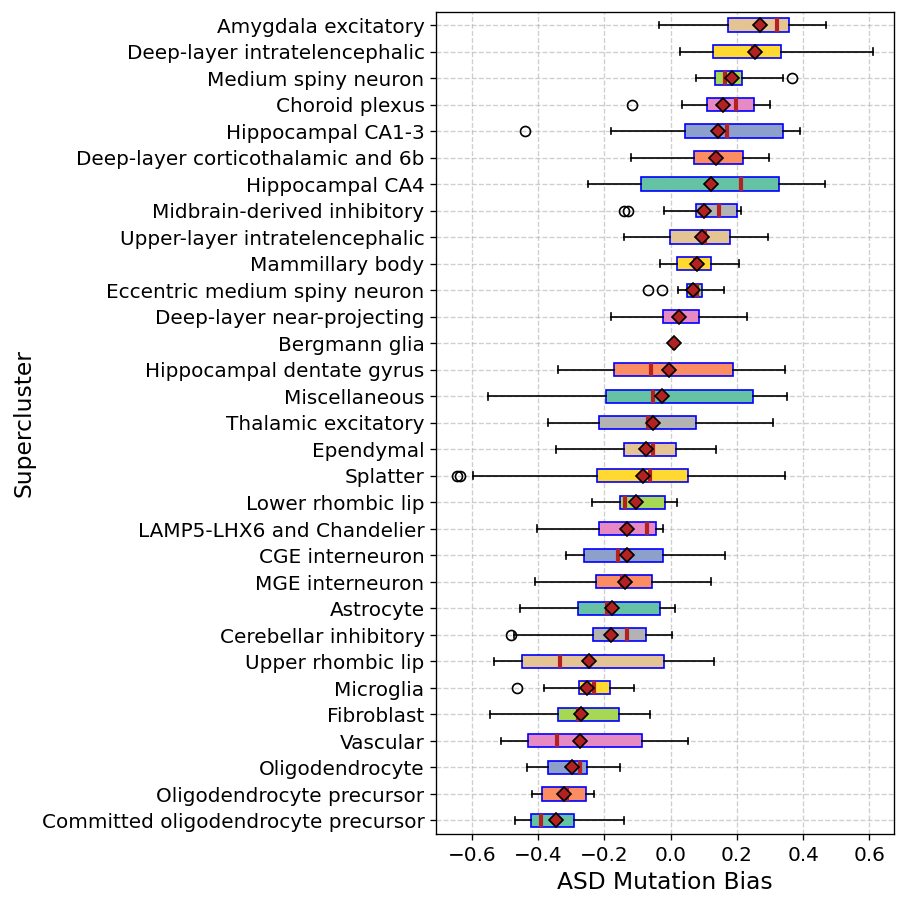

In [130]:
SuperClusterBias_BoxPlot(HighIQ_ASD_Bias, "ASD", NeuroOnly=False, sortby="mean")

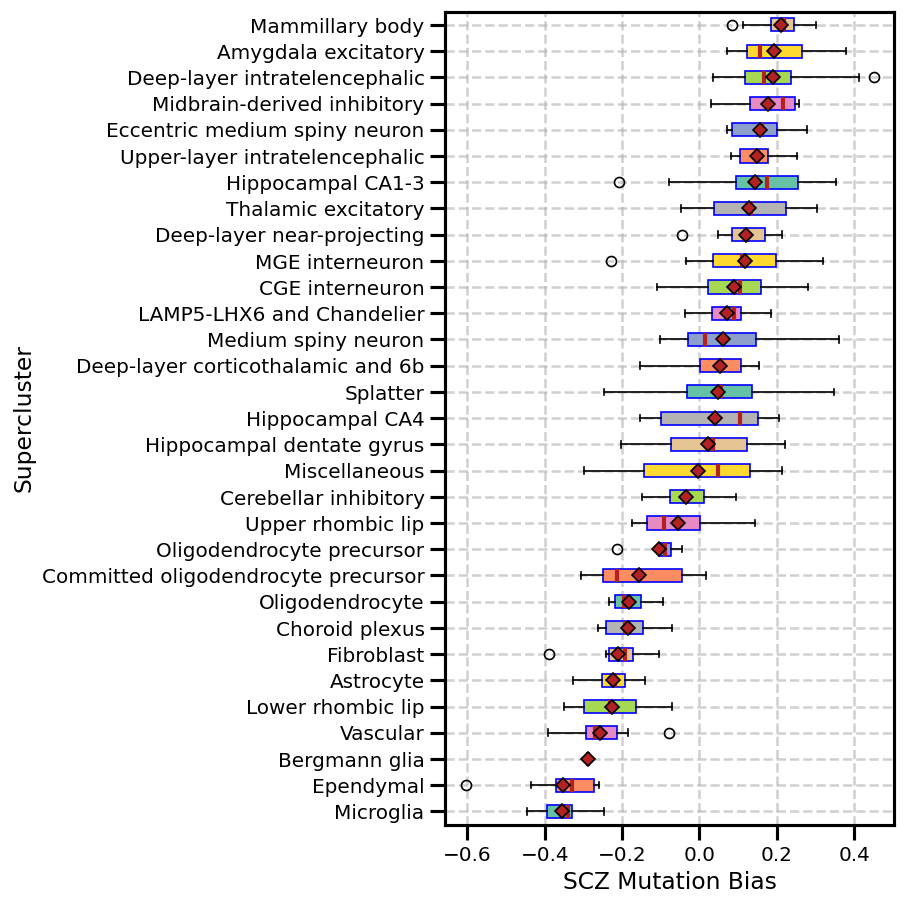

In [131]:
SuperClusterBias_BoxPlot(SCZ_Bias, "SCZ", NeuroOnly=False)
#SuperClusterBias_BoxPlot(SCZ_Bias, "SCZ")

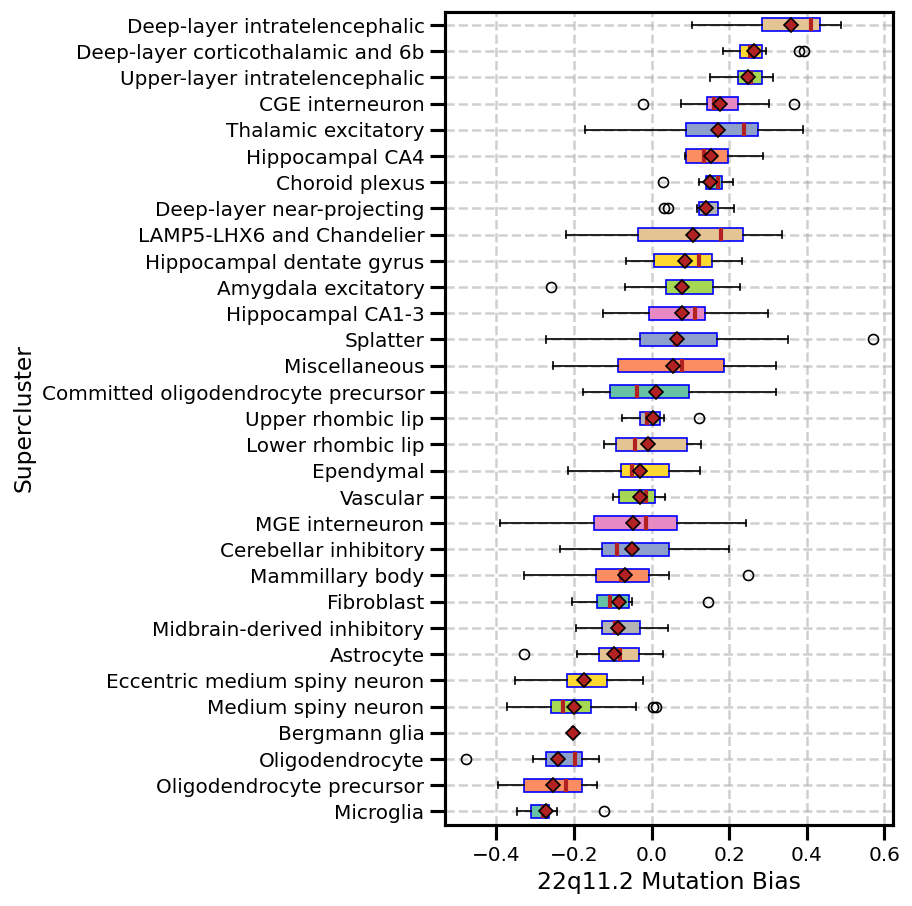

In [132]:
SuperClusterBias_BoxPlot(X22q_Bias, "22q11.2")

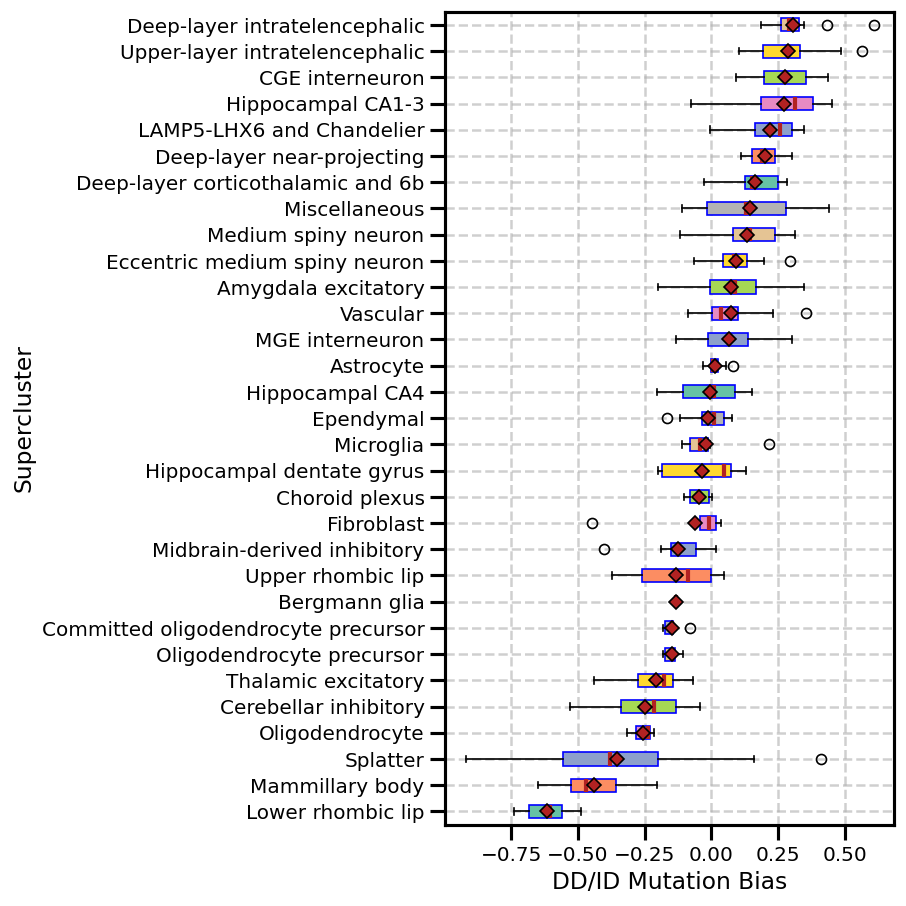

In [133]:
SuperClusterBias_BoxPlot(DDD_Bias, "DD/ID")

### Bias Correlations and contrast of certain cell types

#### Bias Correlation

SignificanceResult(statistic=0.6126347636616644, pvalue=9.941553087937097e-41)
21


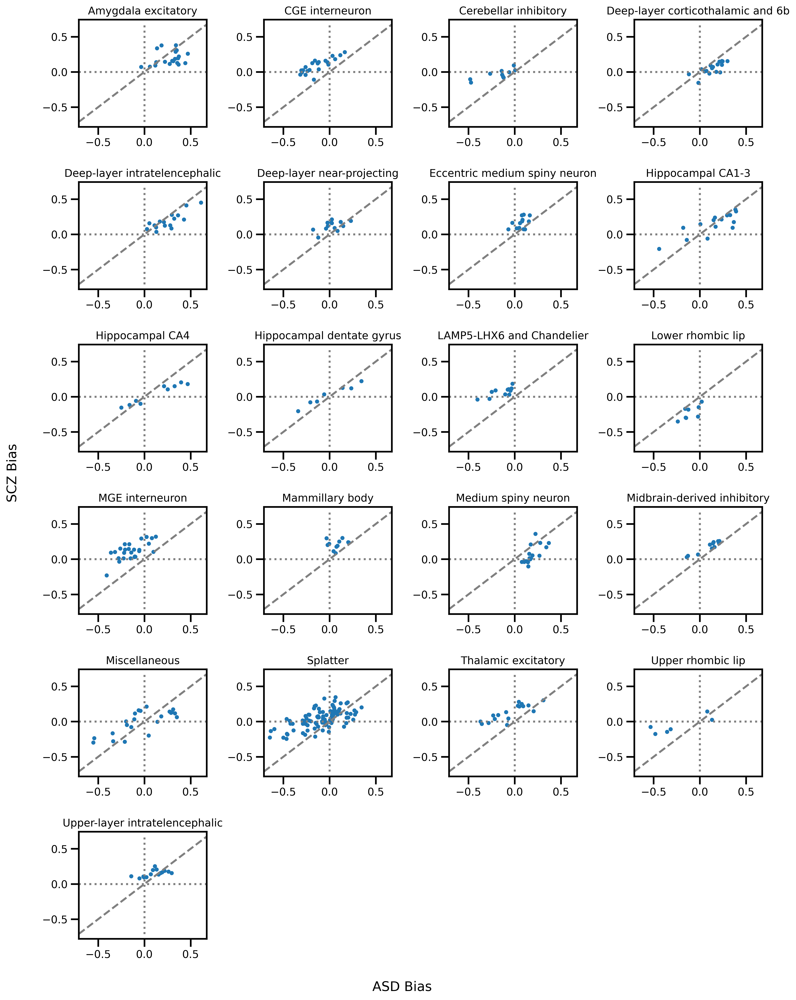

In [134]:
HIQ_ASD_SCZ, fig = CompareCT(HighIQ_ASD_Bias, SCZ_Bias, "ASD","SCZ", "",  SuperClusters=Neurons)

In [135]:
HIQ_ASD_SCZ, fig = CompareCT(HighIQ_ASD_Bias, SCZ_Bias, "ASD","SCZ", "",  SuperClusters=ALL_CTs)

SignificanceResult(statistic=0.6437016722784902, pvalue=2.7128904230697592e-55)
31


In [136]:
HIQ_LIQ_ASD, fig = CompareCT(HighIQ_ASD_Bias, LowIQ_ASD_Bias, "ASD","ASD with ID", "",  SuperClusters=ALL_CTs)

SignificanceResult(statistic=0.7430009394547734, pvalue=4.530417552861137e-82)
31


In [229]:
def PlotBiasContrast2(DF, label1, label2, name1, name2, title=""):
    fig, ax = plt.subplots(dpi=300, figsize=(5, 5))

    X = DF[label1].values; Y=DF[label2].values
    r_all, p_all = spearmanr(X, Y)

    
    DF_neur = DF.loc[Neur_idx, :]
    X = DF_neur[label1].values; Y=DF_neur[label2].values
    r_neur, p_neur = spearmanr(X, Y)
    ax.scatter(X, Y, s=40, color="darkblue", edgecolor='black', alpha=0.7, label="Neuron")
    
    #ax.set_title(title, fontsize=14, pad=15)
    
    xmin = min(min(X), min(Y), -max(X), -max(Y)) * 1.05
    xmax = max(max(X), max(Y), -min(X), -min(Y)) * 1.05

    # Add the diagonal line
    ax.plot([xmin, xmax], [xmin, xmax], color="grey", linestyle="--", linewidth=1.5)
    
    # Add zero axes
    ax.axhline(0, color="grey", linestyle=":", linewidth=1)
    ax.axvline(0, color="grey", linestyle=":", linewidth=1)
    
    ax.set_xlim((xmin, xmax))
    ax.set_ylim((xmin, xmax))
    
    
    # Adjust text position to avoid overlap
    text_x = xmin * 0.85
    text_y = xmax * 0.85
    
    # Position text for "All Cell Types" correlation in top left
    ax.text(text_x, text_y, 
            s=f"SpearmanR = {r_all:.2f}\nP = {p_all:.1e} (All Cell Types)",
            fontsize=10,
            bbox=dict(facecolor='white', alpha=0.8, edgecolor='none'))
    
    # Position text for "Neuron Types" correlation below with more spacing
    ax.text(text_x, text_y - 0.13,
            s=f"SpearmanR = {r_neur:.2f}\nP = {p_neur:.1e} (Neuron Types)", 
            fontsize=10, 
            bbox=dict(facecolor='white', alpha=0.8, edgecolor='none'))

    DF_nonneur = DF.loc[NonNeur_idx, :]
    X = DF_nonneur[label1].values; Y=DF_nonneur[label2].values
    ax.scatter(X, Y, s=40, color="darkred", edgecolor='black', alpha=0.7, label="Non-Neuron")

    ax.set_xlabel(name1, fontsize=18)
    ax.set_ylabel(name2, fontsize=18)
    
    # Style adjustments
    ax.grid(True, linestyle='--', alpha=0.6)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    
    plt.xticks(fontsize=10)
    plt.yticks(fontsize=10)
    ax.legend(fontsize=15)
    plt.tight_layout()
    plt.show()

    #print(spearmanr(res["EFFECT_{}".format(name1)].values, res["EFFECT_{}".format(name2)].values))

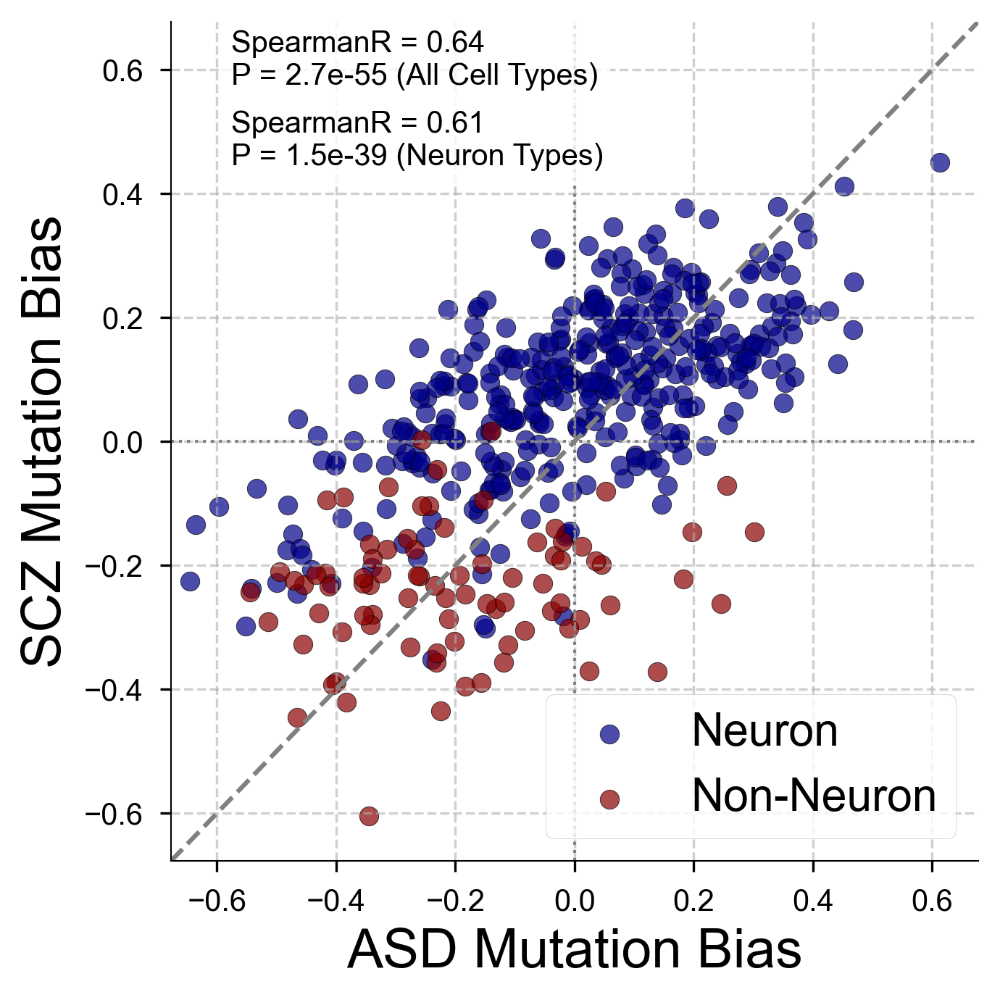

In [230]:
#plt.scatter(res["EFFECT_ASD"].values, res["EFFECT_SCZ"].values)

PlotBiasContrast2(HIQ_ASD_SCZ, label1 = "EFFECT_ASD", label2 = "EFFECT_SCZ", 
                 name1 = "ASD Mutation Bias", name2 = "SCZ Mutation Bias", 
                title = "")

#### Overall Contrasts

In [139]:
def combineBias(Bias1, Bias2, name1="1", name2 = "2"):
    res = Bias1.join(Bias2, how = 'inner', lsuffix="_{}".format(name1), rsuffix="_{}".format(name2))
    res["Diff"] = res["EFFECT_{}".format(name1)] - res["EFFECT_{}".format(name2)]
    return res

In [140]:
def compare_biases(bias1, bias2, name1="1", name2="2", neurons=None):
    """
    Compare two bias datasets and calculate statistics for each cell type.
    
    Args:
        bias1: First bias DataFrame
        bias2: Second bias DataFrame 
        name1: Name/label for first bias dataset (default: "1")
        name2: Name/label for second bias dataset (default: "2")
        neurons: List of neuron types to analyze (default: None)
        
    Returns:
        DataFrame with comparison statistics for each cell type
    """
    BiasDF_cb = combineBias(bias1, bias2, name1=name1, name2=name2)

    # Create list to store results
    results_list = []

    for CT in neurons:
        # Filter data for current CT using proper column name
        CT_mask = BiasDF_cb[f"Supercluster_{name1}"] == CT
        CT_data = BiasDF_cb[CT_mask]
        
        # Get bias values, checking for empty results
        CT_Bias1 = CT_data[f"EFFECT_{name1}"].values
        CT_Bias2 = CT_data[f"EFFECT_{name2}"].values
        stm_1 = np.std(CT_Bias1) / np.sqrt(len(CT_Bias1))
        stm_2 = np.std(CT_Bias2) / np.sqrt(len(CT_Bias2))
        
        if len(CT_Bias1) == 0 or len(CT_Bias2) == 0:
            print(f"Warning: No data found for {CT}")
            continue
            
        # Calculate statistics
        bias = np.mean(CT_Bias1) - np.mean(CT_Bias2)
        
        try:
            t_man, p_man = mannwhitneyu(CT_Bias1, CT_Bias2)
            t_wil, p_wil = wilcoxon(CT_Bias1, CT_Bias2)
        except Exception as e:
            print(f"Error calculating statistics for {CT}: {str(e)}")
            continue
        
        # Add results to list with proper string formatting
        results_list.append({
            'CT': CT,
            f'Bias_{name1}': np.mean(CT_Bias1),
            f'Bias_{name2}': np.mean(CT_Bias2), 
            f'STM_{name1}': stm_1,
            f'STM_{name2}': stm_2,
            'Bias_Diff': bias,
            'Mann_Whitney_P': p_man,
            'Wilcoxon_P': p_wil
        })

    # Convert list to DataFrame and sort
    results = pd.DataFrame(results_list)
    if len(results) > 0:
        results = results.sort_values(by="Bias_Diff")
    else:
        print("Warning: No results generated")
        
    return results

In [218]:
def plot_bias_comparison(results, name1, name2, p_test="Wilcoxon_P", legend_anchor=(1, 0)):
    # Create publication-quality figure
    plt.style.use('seaborn-v0_8-paper')
    fig, ax = plt.subplots(figsize=(15, 8), dpi=300)

    # Filter results
    results_to_plot = results[(results[f'Bias_{name1}'] > 0) | (results[f'Bias_{name2}'] > 0)]
    x = np.arange(len(results_to_plot))
    width = 0.35

    # Create bars with refined colors and error bars
    bar1 = ax.bar(x - width/2, results_to_plot[f'Bias_{name1}'], width, 
                  label=name1, color='#3182bd', alpha=0.8,
                  yerr=results_to_plot[f'STM_{name1}'], 
                  capsize=4, error_kw={'ecolor': '#08519c', 'capthick': 1.5})

    bar2 = ax.bar(x + width/2, results_to_plot[f'Bias_{name2}'], width,
                  label=name2, color='#e6550d', alpha=0.8,
                  yerr=results_to_plot[f'STM_{name2}'],
                  capsize=4, error_kw={'ecolor': '#a63603', 'capthick': 1.5})

    # Customize plot appearance
    ax.set_ylabel('Mutation Bias', fontsize=30, )
    ax.set_xticks(x)
    ax.set_xticklabels(results_to_plot['CT'], rotation=45, ha='right', 
                       fontsize=21, fontweight='medium')

    # Add refined legend
    ax.legend(fontsize=21, frameon=True, fancybox=True, framealpha=0.9,
             loc='lower right', bbox_to_anchor=legend_anchor)

    # Add zero line and grid
    ax.axhline(y=0, color='black', linestyle='-', linewidth=1, alpha=0.3)
    ax.grid(True, axis='y', linestyle='--', alpha=0.3)

    # Customize tick parameters
    ax.tick_params(axis='both', which='major', labelsize=21, width=1.5)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_linewidth(1.5)
    ax.spines['bottom'].set_linewidth(1.5)

    # Add significance markers with corrected vertical positioning
    y_max = ax.get_ylim()[1]
    y_min = ax.get_ylim()[0]
    y_range = y_max - y_min

    for i, (idx, row) in enumerate(results_to_plot.iterrows()):
        p_val = row[p_test]

        if p_val < 0.0001:
            marker = '****'
        elif p_val < 0.001:
            marker = '***'
        elif p_val < 0.01:
            marker = '**'
        elif p_val < 0.05:
            marker = '*'
        else:
            marker = 'ns'
            
        # Calculate maximum height of bars and error bars at this position
        bar1_height = row[f'Bias_{name1}'] + row[f'STM_{name1}']
        bar2_height = row[f'Bias_{name2}'] + row[f'STM_{name2}']
        max_height = max(bar1_height, bar2_height)
        
        # Add marker slightly above the highest point
        y_offset = y_range * 0.05  # 5% of the y-axis range
        ax.text(i, max_height + y_offset, marker, 
                ha='center', va='bottom', fontsize=22)

    # Adjust y-axis limits to accommodate markers
    ax.set_ylim(y_min, y_max + y_range * 0.1)  # Add 10% padding at top

    # Adjust layout and display
    plt.tight_layout()
    plt.show()

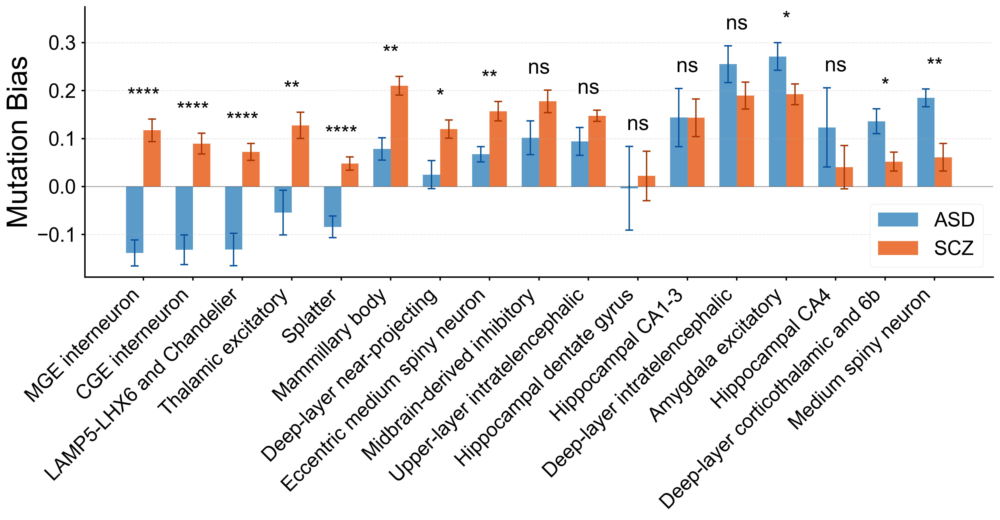

In [219]:
name1="ASD"
name2="SCZ"
ASD_SCZ_Contrast = compare_biases(HighIQ_ASD_Bias, SCZ_Bias, name1="ASD", name2="SCZ", neurons=Neurons)
plot_bias_comparison(ASD_SCZ_Contrast, name1, name2, p_test="Mann_Whitney_P")

In [220]:
ASD_SCZ_Contrast

,CT,Bias_ASD,Bias_SCZ,STM_ASD,STM_SCZ,Bias_Diff,Mann_Whitney_P,Wilcoxon_P
12,MGE interneuron,-0.138153,0.117380,0.027105,0.023559,-0.255533,4.607444e-07,2.980232e-08
1,CGE interneuron,-0.131895,0.089593,0.030916,0.021733,-0.221488,2.377084e-05,9.536743e-07
10,LAMP5-LHX6 and Chandelier,-0.131288,0.072422,0.033692,0.017639,-0.203710,9.734568e-05,4.882812e-04
19,Upper rhombic lip,-0.245767,-0.055994,0.105880,0.044577,-0.189772,2.402597e-01,9.375000e-02
18,Thalamic excitatory,-0.054265,0.127613,0.046560,0.027460,-0.181879,6.507708e-03,1.068115e-04
2,Cerebellar inhibitory,-0.180999,-0.033513,0.052012,0.021101,-0.147486,3.120901e-02,1.953125e-03
17,Splatter,-0.084090,0.048073,0.022594,0.013837,-0.132163,1.291770e-05,3.168600e-09
13,Mammillary body,0.078404,0.210299,0.023450,0.019450,-0.131895,2.026946e-03,9.765625e-04
5,Deep-layer near-projecting,0.024922,0.119833,0.029039,0.018913,-0.094911,1.832552e-02,6.103516e-03
6,Eccentric medium spiny neuron,0.067376,0.157045,0.016003,0.020279,-0.089669,9.430401e-03,1.220703e-03


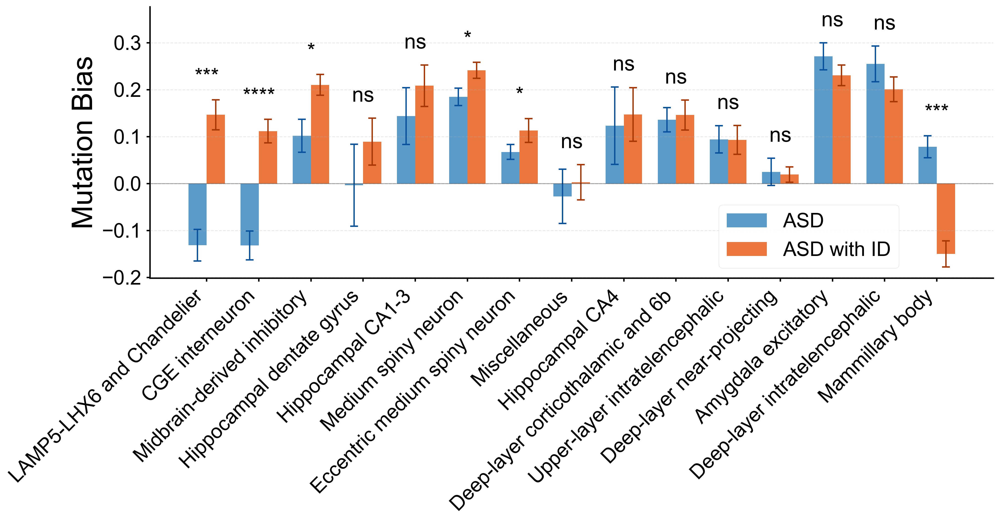

In [222]:
name1="ASD"
name2="ASD with ID"
HIQ_LIQ_ASD_Contrast  = compare_biases(HighIQ_ASD_Bias, LowIQ_ASD_Bias, name1="ASD", name2="ASD with ID", neurons=Neurons)
plot_bias_comparison(HIQ_LIQ_ASD_Contrast, name1, name2, p_test="Mann_Whitney_P", legend_anchor=(0.9, 0))

In [217]:
HIQ_LIQ_ASD_Contrast

,CT,Bias_ASD,Bias_ASD with ID,STM_ASD,STM_ASD with ID,Bias_Diff,Mann_Whitney_P,Wilcoxon_P
10,LAMP5-LHX6 and Chandelier,-0.131288,0.146528,0.033692,0.031884,-0.277816,0.000196,4.882812e-04
1,CGE interneuron,-0.131895,0.111737,0.030916,0.025158,-0.243632,0.000013,9.536743e-07
19,Upper rhombic lip,-0.245767,-0.068794,0.105880,0.052840,-0.176973,0.309524,1.562500e-01
15,Midbrain-derived inhibitory,0.101762,0.210301,0.035180,0.022132,-0.108539,0.014138,4.882812e-04
9,Hippocampal dentate gyrus,-0.003638,0.089336,0.087346,0.049979,-0.092975,0.534965,1.093750e-01
12,MGE interneuron,-0.138153,-0.051205,0.027105,0.016055,-0.086948,0.007749,8.156896e-05
2,Cerebellar inhibitory,-0.180999,-0.109806,0.052012,0.061202,-0.071193,0.241322,1.054688e-01
7,Hippocampal CA1-3,0.143864,0.208557,0.060679,0.044028,-0.064693,0.618670,1.353760e-01
14,Medium spiny neuron,0.184728,0.241318,0.018553,0.016993,-0.056590,0.013005,8.964539e-03
6,Eccentric medium spiny neuron,0.067376,0.113003,0.016003,0.025417,-0.045627,0.032633,4.187012e-02


#### Individual CT Contrasts

In [105]:
def PlotBiasContrast_Diff(X, Y, label1, label2, title="", loc=1, text_x=None, text_y=None):
    fig, ax = plt.subplots(dpi=150, figsize=(4, 4))
    # use defualt matplotlib style
    plt.style.use('default')
    # Improved scatter plot with better color and marker
    scatter = ax.scatter(X, Y, s=40, color='dodgerblue', alpha=0.6, edgecolor='k')

    # Title and axis labels with increased font size and weight
    ax.set_title(title, fontsize=18, weight='normal')
    ax.set_xlabel(label1, fontsize=16, weight='normal')
    ax.set_ylabel(label2, fontsize=16, weight='normal')

    # Setting up limits and plot properties
    xmin = min(min(X), min(Y), -max(X), -max(Y)) * 1.05
    xmax = max(max(X), max(Y), -min(X), -min(Y)) * 1.05
    
    BiasDiff = np.mean(X) - np.mean(Y)
    t_wil, p_wil = wilcoxon(X, Y)

    # Plotting the reference lines with explanations
    ax.plot([xmin,xmax],[xmin,xmax], color="grey", ls="dashed")
    ax.plot([0,0],[xmin,xmax], color="grey", ls="dotted")
    ax.plot([xmin,xmax],[0,0], color="grey", ls="dotted")

    # Setting axis limits
    ax.set_xlim((xmin, xmax))
    ax.set_ylim((xmin, xmax))
    
    # Spearman correlation
    r, p = spearmanr(X, Y)
    
    # Calculate the position for the annotation text
    if text_x is None:
        text_x = xmin*0.7
    if text_y is None:
        text_y = xmax*0.7
    if loc == 1:
        text_x = xmin*0.7
        text_y = xmax*0.7
    elif loc == 2:
        text_x = xmax*0.1
        text_y = -xmax*0.7

    # Add text annotation with white background
    ax.text(text_x, text_y, 
            s=f"BiasDiff={BiasDiff:.2f}\nP={p_wil:.1e}",
            fontsize=12, ha='left', va='top')
    
    # Add a legend to explain the lines
    #ax.legend(fontsize=10, loc='upper left')

    # Improve layout and show plot
    plt.tight_layout()
    plt.show()

def CompareSingleCT_New2(Bias1, Bias2, CT, name1="1", name2="2", title="", loc=1, text_x=None, text_y=None):
    res = Bias1.join(Bias2, how='inner', lsuffix=f"_{name1}", rsuffix=f"_{name2}")
    res["Diff"] = res[f"EFFECT_{name1}"] - res[f"EFFECT_{name2}"]
    res = res[res[f"Supercluster_{name1}"]==CT]
    X = res[f"EFFECT_{name1}"].values
    Y = res[f"EFFECT_{name2}"].values
    #PlotBiasContrast(X, Y, name1, name2, title=CT)
    PlotBiasContrast_Diff(X, Y, name1, name2, title=CT, loc=loc, text_x=text_x, text_y=text_y)

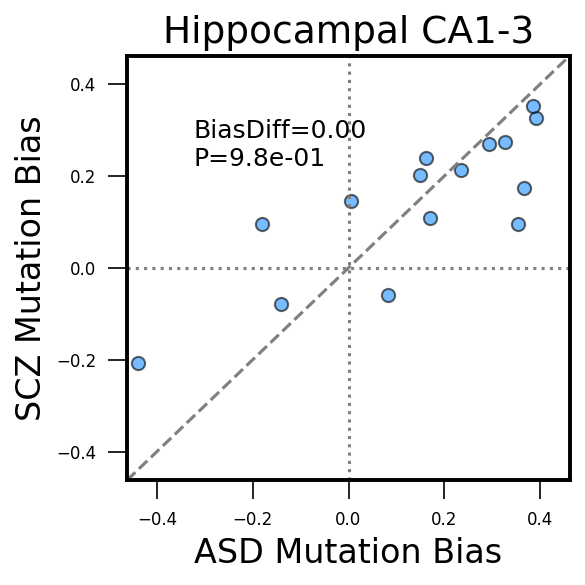

In [147]:
CompareSingleCT_New2(HighIQ_ASD_Bias, SCZ_Bias, "Hippocampal CA1-3",  
                    "ASD Mutation Bias", "SCZ Mutation Bias")

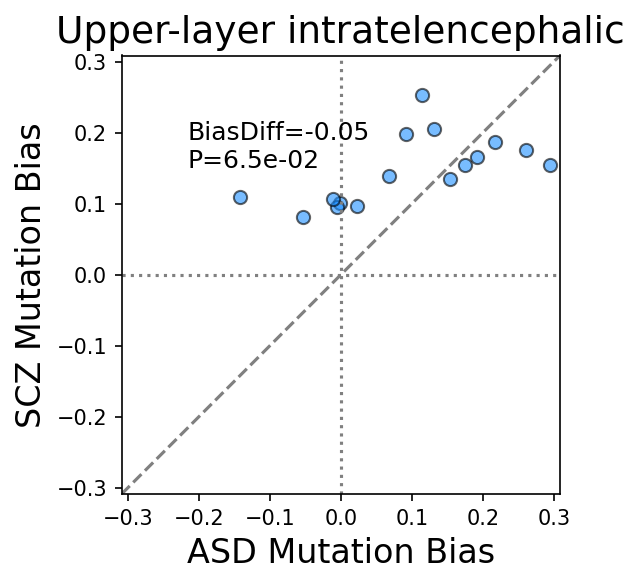

In [148]:
CompareSingleCT_New2(HighIQ_ASD_Bias, SCZ_Bias, "Upper-layer intratelencephalic",  
                    "ASD Mutation Bias", "SCZ Mutation Bias")

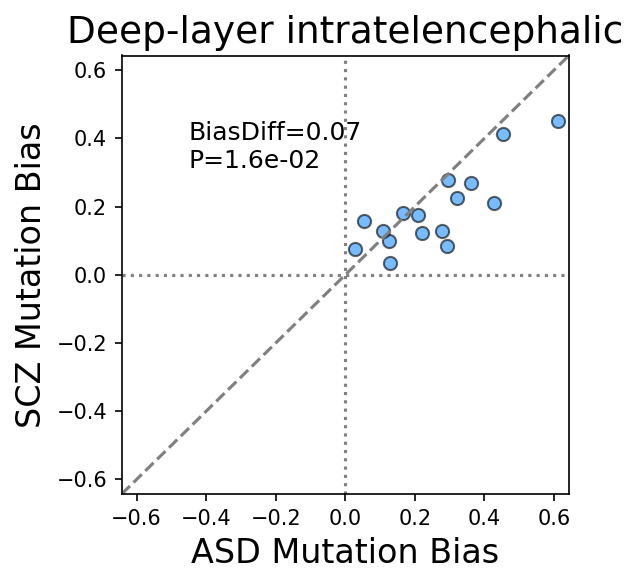

In [149]:
CompareSingleCT_New2(HighIQ_ASD_Bias, SCZ_Bias, "Deep-layer intratelencephalic",  
                    "ASD Mutation Bias", "SCZ Mutation Bias")

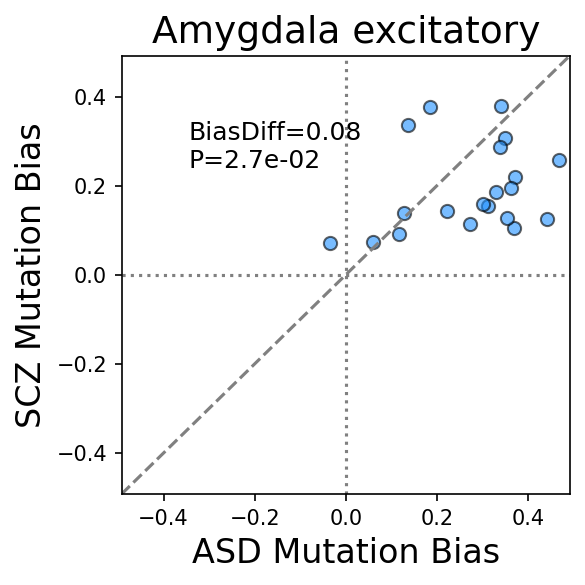

In [150]:
CompareSingleCT_New2(HighIQ_ASD_Bias, SCZ_Bias, "Amygdala excitatory",  
                    "ASD Mutation Bias", "SCZ Mutation Bias")

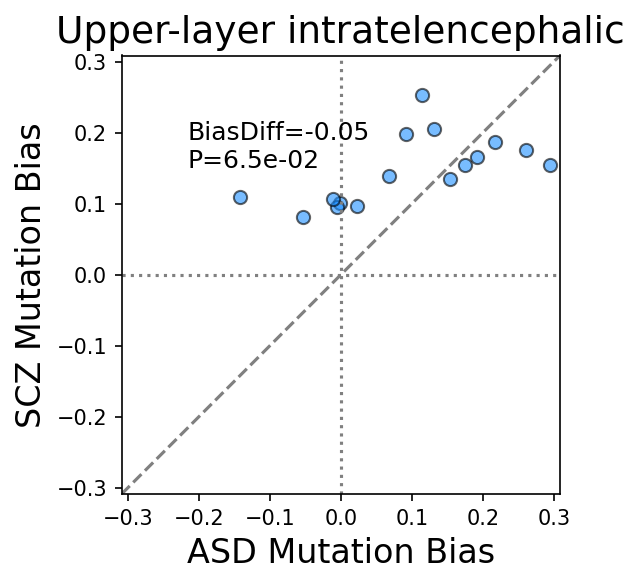

In [151]:
CompareSingleCT_New2(HighIQ_ASD_Bias, SCZ_Bias, "Upper-layer intratelencephalic",  
                    "ASD Mutation Bias", "SCZ Mutation Bias")

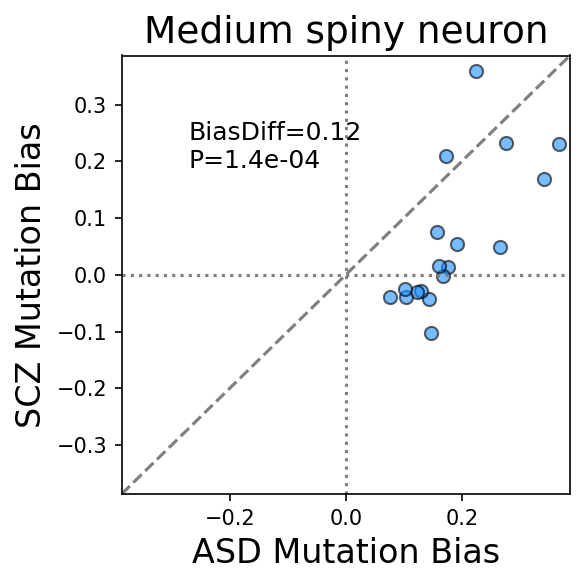

In [152]:
CompareSingleCT_New2(HighIQ_ASD_Bias, SCZ_Bias, "Medium spiny neuron",  
                     "ASD Mutation Bias", "SCZ Mutation Bias")

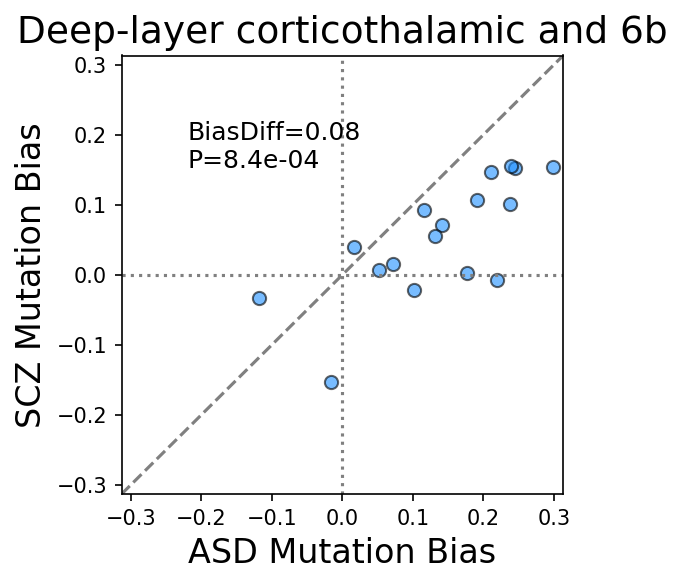

In [153]:
CompareSingleCT_New2(HighIQ_ASD_Bias, SCZ_Bias, "Deep-layer corticothalamic and 6b",  
                     "ASD Mutation Bias", "SCZ Mutation Bias")

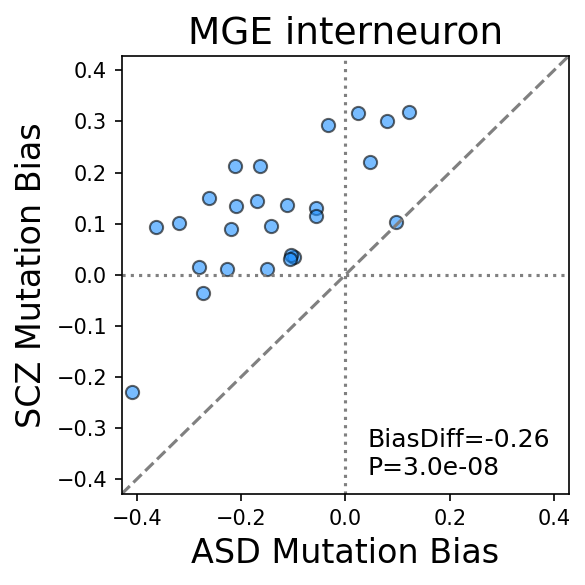

In [154]:
CompareSingleCT_New2(HighIQ_ASD_Bias, SCZ_Bias, "MGE interneuron",  
                    "ASD Mutation Bias", "SCZ Mutation Bias", loc=2
                   )

### SCZ HIQ 22q VIP

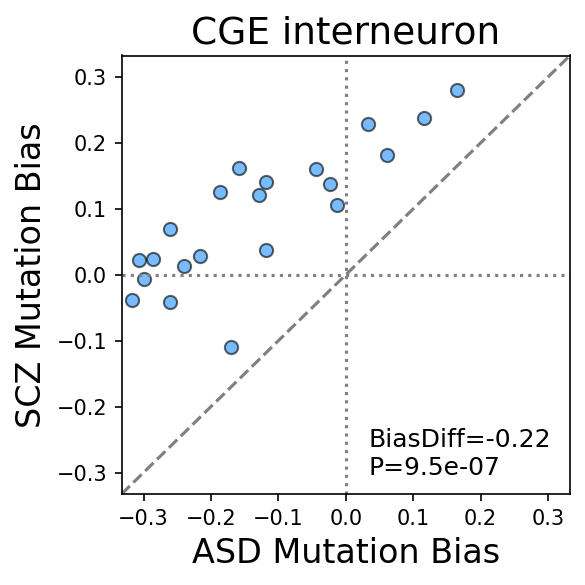

In [114]:
CompareSingleCT_New2(HighIQ_ASD_Bias, SCZ_Bias, "CGE interneuron",  "ASD Mutation Bias", 
                    "SCZ Mutation Bias", loc=2)

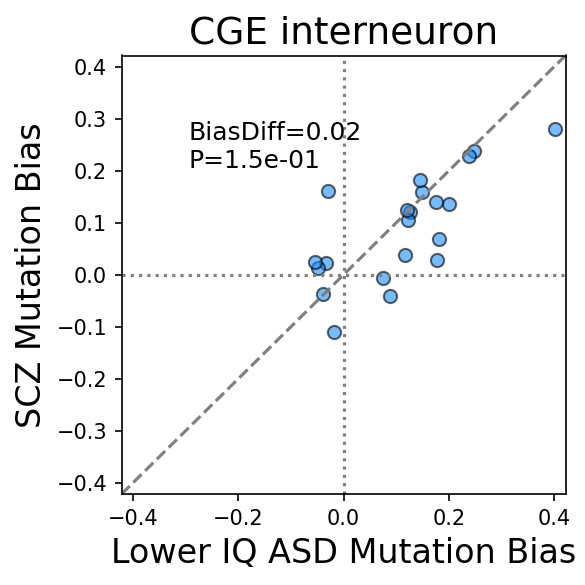

In [115]:
CompareSingleCT_New2(LowIQ_ASD_Bias, SCZ_Bias, "CGE interneuron",  "Lower IQ ASD Mutation Bias", 
                    "SCZ Mutation Bias",)

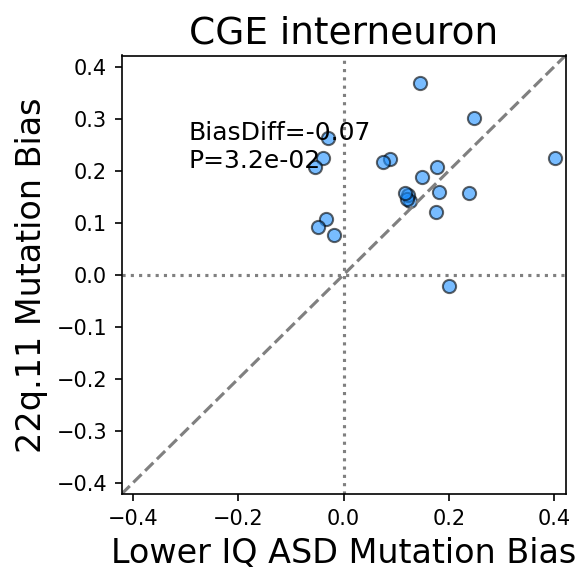

In [116]:
CompareSingleCT_New2(LowIQ_ASD_Bias, X22q_Bias, "CGE interneuron",  "Lower IQ ASD Mutation Bias", 
                    "22q.11 Mutation Bias",)

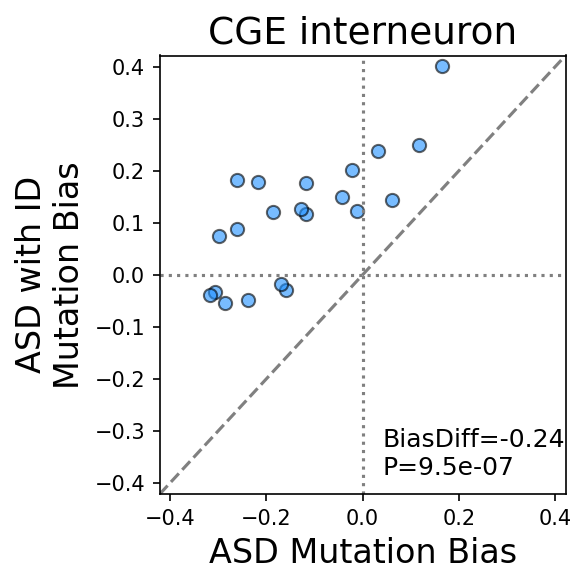

In [117]:
CompareSingleCT_New2(HighIQ_ASD_Bias, LowIQ_ASD_Bias, "CGE interneuron",  "ASD Mutation Bias", 
                    "ASD with ID\nMutation Bias", loc=2)

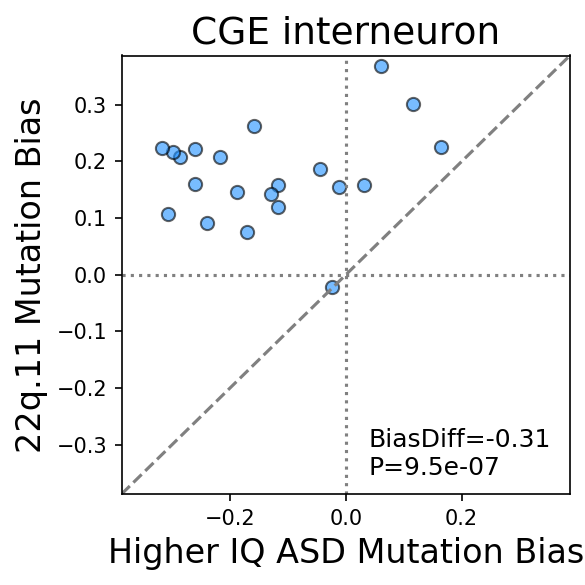

In [118]:
CompareSingleCT_New2(HighIQ_ASD_Bias, X22q_Bias, "CGE interneuron",  "Higher IQ ASD Mutation Bias", 
                    "22q.11 Mutation Bias",loc=2)

In [119]:
VNR_Pos_Bias = pd.read_csv(os.path.join(Bias_Save_Dict, "CTBias.VNR.Pos.top61.csv"), index_col=0)
VNR_Neg_Bias = pd.read_csv(os.path.join(Bias_Save_Dict, "CTBias.VNR.Neg.top61.csv"), index_col=0)

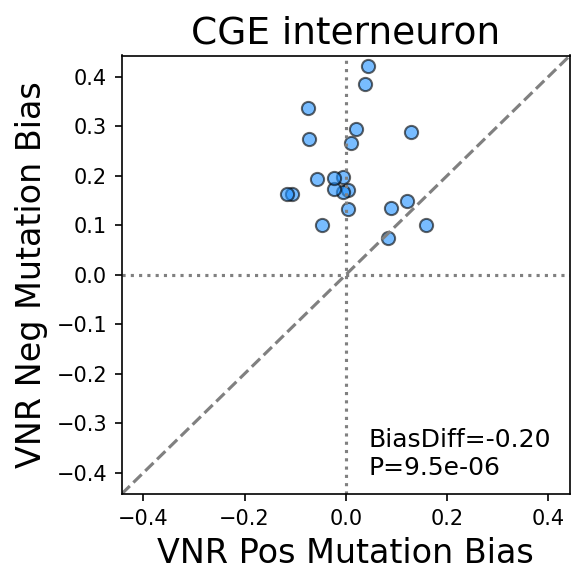

In [120]:
CompareSingleCT_New2(VNR_Pos_Bias, VNR_Neg_Bias, "CGE interneuron",  "VNR Pos Mutation Bias", 
                    "VNR Neg Mutation Bias",loc=2)

In [121]:
DDD_Bias = pd.read_csv(os.path.join(Bias_Save_Dict, "HCT.DDDHC.Z2.HCT.top61.csv"), index_col=0)

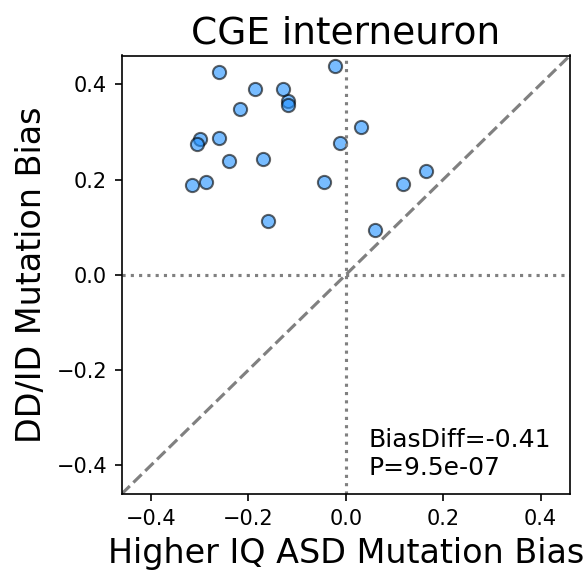

In [122]:
CompareSingleCT_New2(HighIQ_ASD_Bias, DDD_Bias, "CGE interneuron",  "Higher IQ ASD Mutation Bias", 
                    "DD/ID Mutation Bias",loc=2)

### Figure 2Boxplot

#### Multi-Pair Plot

In [210]:
CT = "CGE interneuron"
CT_idx = Anno[Anno["Supercluster"]==CT].index.values

def plot_mutation_bias_comparison(CT, datasets, anno_df):
    """
    Create a comparative plot of mutation bias across multiple datasets for a given cell type.
    
    Parameters:
    -----------
    CT : str
        Cell type name to plot
    datasets : dict
        Dictionary of dataset name -> bias dataframe pairs
    anno_df : pandas DataFrame
        Annotation dataframe with cell type information
        
    Returns:
    --------
    None, displays plot
    """
    # Get cell type indices
    CT_idx = anno_df[anno_df["Supercluster"]==CT].index.values
    
    # Get data for each dataset
    data = {name: df.loc[CT_idx, "EFFECT"] for name, df in datasets.items()}

    # Calculate means and sort datasets
    means = {k: v.mean() for k,v in data.items()}
    sorted_datasets = sorted(data.keys(), key=lambda x: means[x])
    sorted_data = {k: data[k] for k in sorted_datasets}

    # Set style for Nature publication
    plt.style.use('seaborn-v0_8-paper')
    plt.rcParams['font.family'] = 'Arial'
    plt.rcParams['font.size'] = 20  # Increased from 8
    plt.rcParams['font.weight'] = 'normal'  # Added bold
    plt.rcParams['axes.linewidth'] = 0.5
    plt.rcParams['xtick.major.width'] = 0.5
    plt.rcParams['ytick.major.width'] = 0.5

    # Create figure
    fig, ax = plt.subplots(figsize=(4.5, 3.5), dpi=300)

    # Plot individual points and connect same cell types
    positions = range(1, len(sorted_data)+1)
    n_cells = len(CT_idx)

    # Create arrays to store coordinates
    x_coords = np.zeros((n_cells, len(sorted_data)))
    y_coords = np.zeros((n_cells, len(sorted_data)))

    # Plot points and store coordinates
    colors = plt.cm.Set2(np.linspace(0, 1, len(sorted_data)))
    for i, (pos, (label, values)) in enumerate(zip(positions, sorted_data.items())):
        x = np.random.normal(pos, 0.04, size=len(values))
        ax.scatter(x, values, color=colors[i], s=15, alpha=1, label=label)
        
        # Store coordinates for connecting lines
        x_coords[:, i] = x
        y_coords[:, i] = values

    # Connect points for same cell type
    # for cell in range(n_cells):
    #     ax.plot(x_coords[cell], y_coords[cell], color='grey', alpha=0.2, 
    #             linewidth=0.5, ls='dotted')

    # Add boxplots
    bp = ax.boxplot([v for v in sorted_data.values()], positions=positions,
                    showfliers=False, patch_artist=True, widths=0.5)

    #Customize boxplots
    for i, box in enumerate(bp['boxes']):
        box.set(facecolor='white', alpha=0.2)
        box.set(edgecolor='black', linewidth=0.5)
    plt.setp(bp['medians'], color='grey', linewidth=1)
    plt.setp(bp['whiskers'], color='grey', linewidth=0.5)
    plt.setp(bp['caps'], color='grey', linewidth=0.5)

    # Customize plot
    ax.axhline(y=0, color='black', linestyle='--', linewidth=0.5, alpha=0.5)
    ax.set_xticks(range(1,len(sorted_data)+1))
    ax.set_xticklabels(sorted_data.keys(), rotation=45, ha='center', weight='normal')  # Added bold
    ax.set_ylabel('Mutation Bias', labelpad=5, weight='normal' )  # Added bold
    ax.set_title(f'{CT}', pad=10, weight='normal')  # Added bold

    # Adjust layout
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_color('grey')
    ax.spines['left'].set_alpha(0.6)
    ax.spines['bottom'].set_color('grey') 
    ax.spines['bottom'].set_alpha(0.6)
    ax.grid(axis='y', linestyle='--', alpha=0.3)
    plt.tight_layout()

    plt.show()


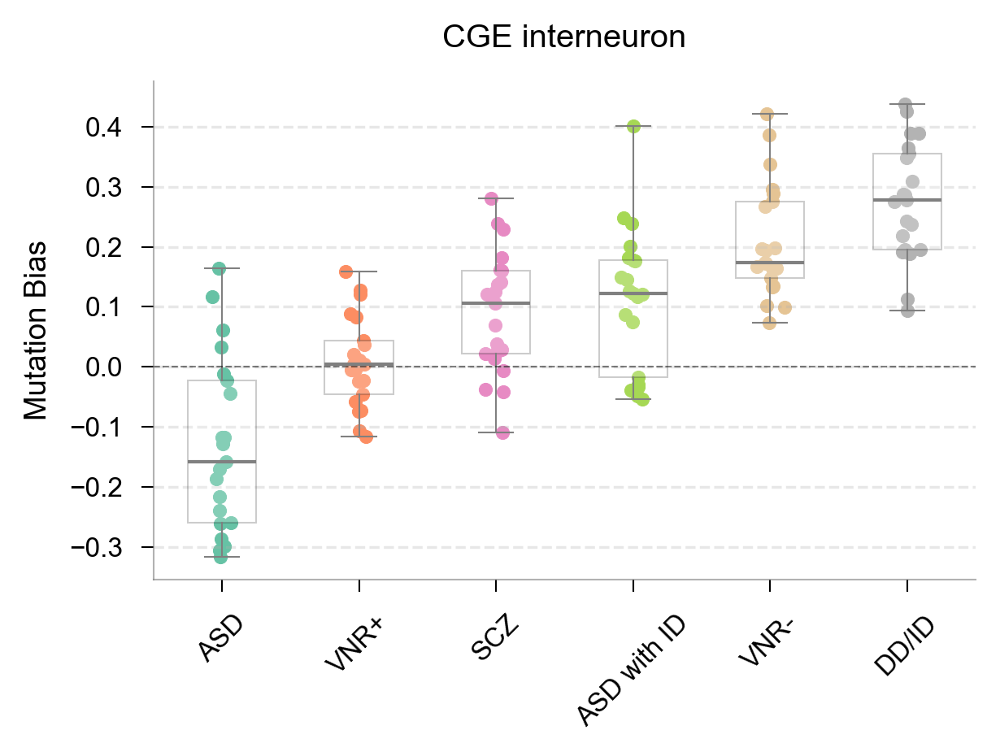

In [211]:
# Example usage:
datasets = {
    'ASD': HighIQ_ASD_Bias,
    'ASD with ID': LowIQ_ASD_Bias,
    'VNR+': VNR_Pos_Bias,
    'VNR-': VNR_Neg_Bias,
    'DD/ID': DDD_Bias,
    'SCZ': SCZ_Bias
}

plot_mutation_bias_comparison("CGE interneuron", datasets, Anno)

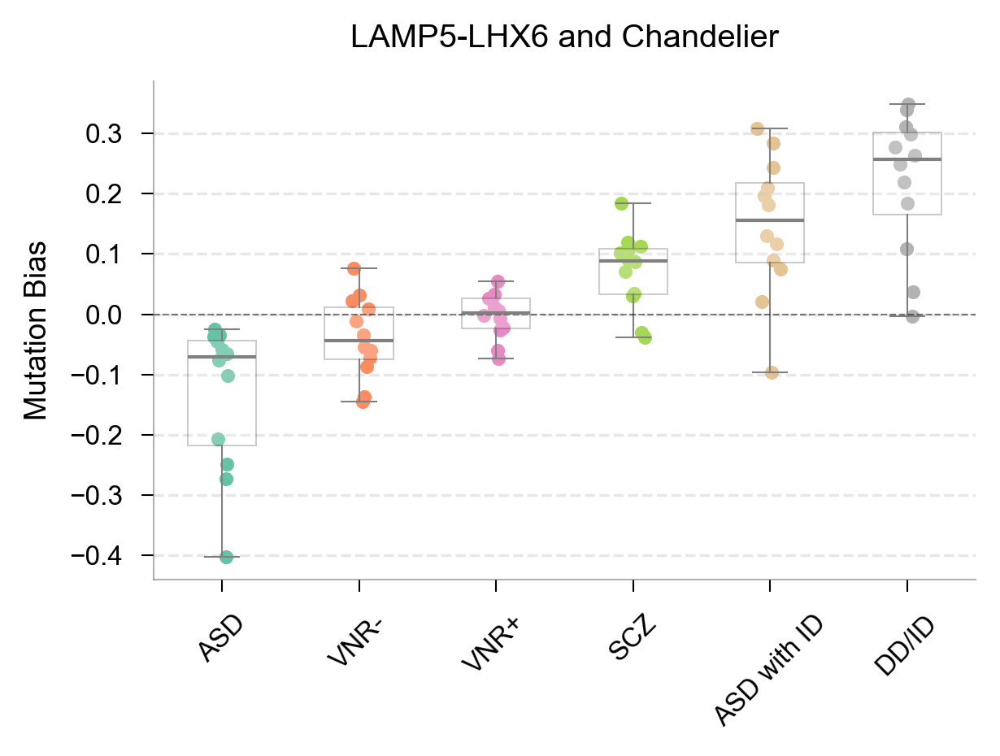

In [212]:

plot_mutation_bias_comparison("LAMP5-LHX6 and Chandelier", datasets, Anno)

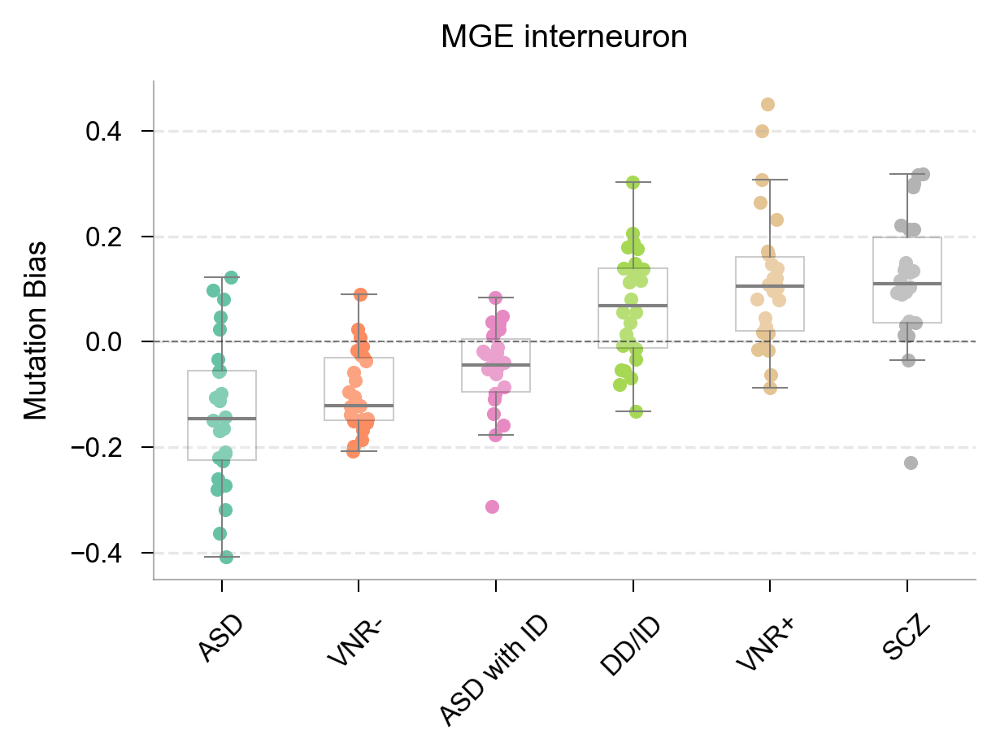

In [213]:

plot_mutation_bias_comparison("MGE interneuron", datasets, Anno)


### VIP 

In [155]:
#ExpL = pd.read_csv("/home/jw3514/Work/CellType_Psy/dat/HumanCTExpressionMats/Human.Cluster.Log2Mean.Exp.csv", index_col=0)
ExpL = pd.read_csv("/home/jw3514/Work/CellType_Psy/dat/HumanCTExpressionMats/Human.CT.Exp.Entrez.csv", index_col=0)
ExpL.columns = [int(x) for x in ExpL.columns.values ]

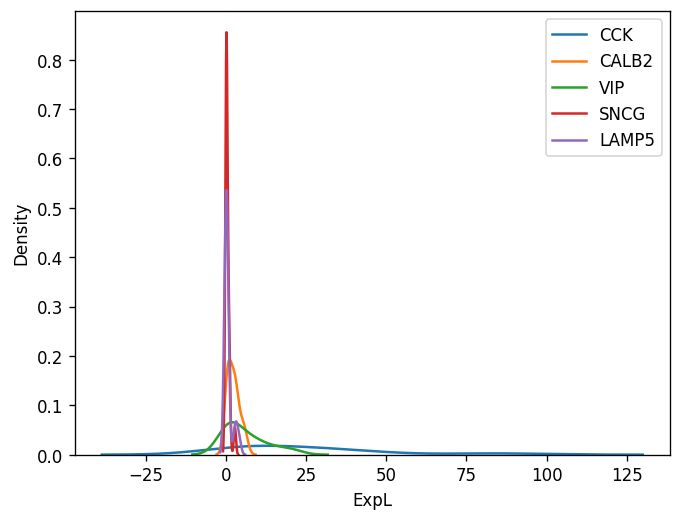

In [156]:
CGE_idx = Anno[Anno["Supercluster"]=="CGE interneuron"].index.values
CT = CGE_idx
PVALB_expl = ExpL.loc[GeneSymbol2Entrez["PVALB"], CT] 
CCK_expl = ExpL.loc[GeneSymbol2Entrez["CCK"], CT]
CALB2_expl = ExpL.loc[GeneSymbol2Entrez["CALB2"], CT]
SST_expl = ExpL.loc[GeneSymbol2Entrez["SST"], CT]
VIP_expl = ExpL.loc[GeneSymbol2Entrez["VIP"], CT]
SNCG_expl = ExpL.loc[GeneSymbol2Entrez["SNCG"], CT]
LAMP5_expl = ExpL.loc[GeneSymbol2Entrez["LAMP5"], CT]

plt.figure(dpi=120)
#sns.kdeplot(PVALB_expl, label="PVALB")
sns.kdeplot(CCK_expl, label="CCK")
sns.kdeplot(CALB2_expl, label="CALB2")
#sns.kdeplot(SST_expl, label="SST")
sns.kdeplot(VIP_expl, label="VIP")
sns.kdeplot(SNCG_expl, label="SNCG")
sns.kdeplot(LAMP5_expl, label="LAMP5")
plt.xlabel("ExpL")
plt.legend()

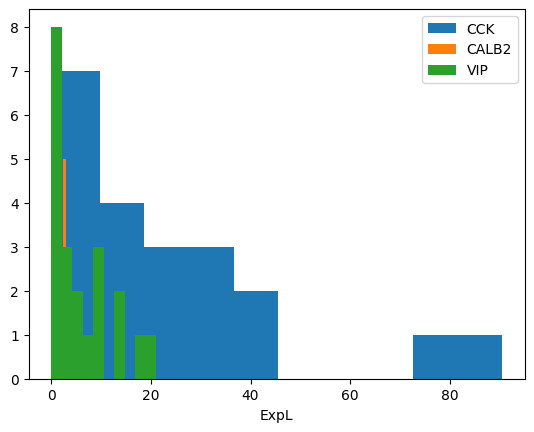

In [157]:
plt.hist(CCK_expl, label="CCK")
plt.hist(CALB2_expl, label="CALB2")
#sns.kdeplot(SST_expl, label="SST")
plt.hist(VIP_expl, label="VIP")
plt.xlabel("ExpL")
plt.legend()

In [158]:
GABA_ALL = Anno[(Anno["Supercluster"]=="CGE interneuron")]
GABA_ALL_idx = GABA_ALL.index.values

Name1="HIQ ASD"
Name2="22q.11"
index = []
PV = []
SST = []
VIP = []
CCK = []
GABA = []
CR = []
BiasA = []
BiasB = []
BiasC = []
Bias4 = []
Bias5 = []
Bias6 = []
for idx in GABA_ALL_idx:
    PV.append(ExpL.loc[GeneSymbol2Entrez["PVALB"], idx] )
    SST.append(ExpL.loc[GeneSymbol2Entrez["SST"], idx] )
    VIP.append(ExpL.loc[GeneSymbol2Entrez["VIP"], idx] )
    CCK.append(ExpL.loc[GeneSymbol2Entrez["CCK"], idx] )
    GABA.append(ExpL.loc[GeneSymbol2Entrez["SLC32A1"], idx] )
    CR.append(ExpL.loc[GeneSymbol2Entrez["CALB2"], idx] )

    BiasA.append(HighIQ_ASD_Bias.loc[idx, "EFFECT"])
    BiasB.append(X22q_Bias.loc[idx, "EFFECT"])
    BiasC.append(SCZ_Bias.loc[idx, "EFFECT"])
    Bias4.append(VNR_Neg_Bias.loc[idx, "EFFECT"])
    Bias5.append(DDD_Bias.loc[idx, "EFFECT"])
    Bias6.append(LowIQ_ASD_Bias.loc[idx, "EFFECT"])
tmpdf = pd.DataFrame({"Index":GABA_ALL_idx, "PV":PV, "SST":SST, "VIP":VIP, "CCK":CCK, "GABA":GABA, 
                      "CR":CR,
                      "EFFECT_"+Name1:BiasA, 
                      "EFFECT_"+Name2:BiasB,
                      "EFFECT_SCZ":BiasC,
                      "EFFECT_VNR":Bias4,
                      "EFFECT_DD":Bias5,
                      "EFFECT_LIQ":Bias6,
                     })
tmpdf = tmpdf.set_index("Index")

In [159]:
tmpdf

,PV,SST,VIP,CCK,GABA,CR,EFFECT_HIQ ASD,EFFECT_22q.11,EFFECT_SCZ,EFFECT_VNR,EFFECT_DD,EFFECT_LIQ
Index,,,,,,,,,,,,
276,0.004808,0.805288,8.779327,24.634615,0.914423,0.432692,0.164934,0.224608,0.280570,0.163673,0.218331,0.401873
277,0.005455,0.162424,0.045455,2.483636,1.015151,1.058788,0.032256,0.158245,0.229249,0.099654,0.309827,0.239016
278,0.007385,1.052111,0.081232,45.028008,0.681064,0.451999,-0.023045,-0.020879,0.137091,0.174296,0.438523,0.200960
279,0.012493,0.159457,2.963595,90.443985,0.822407,1.023106,0.116531,0.302001,0.238356,0.134054,0.191295,0.248799
280,0.015276,0.081277,1.858206,78.125930,0.666079,1.327654,-0.012373,0.154299,0.105507,0.133652,0.277653,0.122604
281,0.010295,0.102059,4.373322,33.676365,0.689346,2.556849,0.060760,0.368459,0.182366,0.167203,0.093174,0.144710
282,0.065673,0.440536,0.197715,29.134228,0.512966,0.486140,-0.170458,0.076188,-0.109912,0.288719,0.242474,-0.017909
283,0.010624,1.174502,0.125517,2.032437,0.596841,2.818165,-0.239305,0.091905,0.013407,0.422103,0.237960,-0.048330
284,0.009551,0.463717,5.386541,0.769239,0.667362,3.823691,-0.117662,0.120284,0.140991,0.267258,0.364576,0.175963


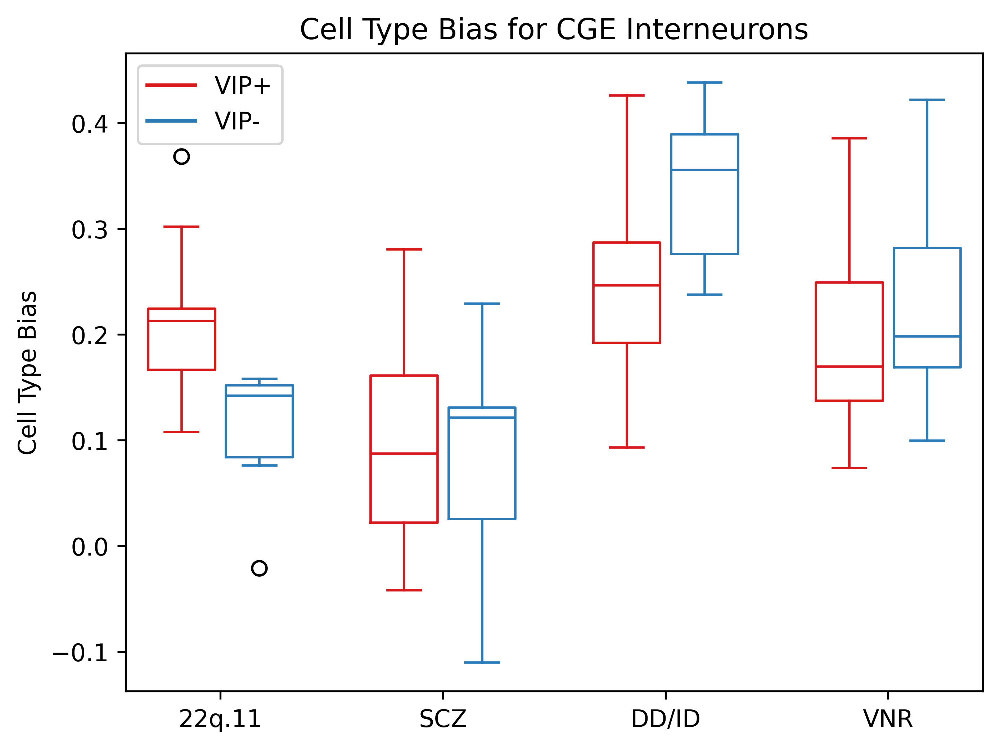

In [160]:
import matplotlib.pyplot as plt
 
# import the numpy package
import numpy as np
 
# create 2 - sample a 3-Dim array, that measures
# the summer and winter rain fall amount
VIP1 = [tmpdf[tmpdf["VIP"]>1]["EFFECT_22q.11"], 
               tmpdf[tmpdf["VIP"]>1]["EFFECT_SCZ"],
               tmpdf[tmpdf["VIP"]>1]["EFFECT_DD"],
               tmpdf[tmpdf["VIP"]>1]["EFFECT_VNR"]]

VIP2 = [tmpdf[tmpdf["VIP"]<1]["EFFECT_22q.11"], 
               tmpdf[tmpdf["VIP"]<1]["EFFECT_SCZ"],
               tmpdf[tmpdf["VIP"]<1]["EFFECT_DD"],
               tmpdf[tmpdf["VIP"]<1]["EFFECT_VNR"]]
 
# the list named ticks, summarizes or groups
# the summer and winter rainfall as low, mid
# and high
ticks = ['22q.11', 'SCZ', 'DD/ID', "VNR"]
 
plt.figure(dpi=480)
summer_rain_plot = plt.boxplot(VIP1,
                               positions=np.array(
    np.arange(len(VIP1)))*2.0-0.35, 
                               widths=0.6)
winter_rain_plot = plt.boxplot(VIP2,
                               positions=np.array(
    np.arange(len(VIP2)))*2.0+0.35,
                               widths=0.6)
 
def define_box_properties(plot_name, color_code, label):
    for k, v in plot_name.items():
        plt.setp(plot_name.get(k), color=color_code)
    plt.plot([], c=color_code, label=label)
    plt.legend()
 
 
# setting colors for each groups
define_box_properties(summer_rain_plot, '#D7191C', 'VIP+')
define_box_properties(winter_rain_plot, '#2C7BB6', 'VIP-')
 
# set the x label values
plt.xticks(np.arange(0, len(ticks) * 2, 2), ticks)
plt.ylabel("Cell Type Bias")
# set the limit for x axis
#plt.xlim(-2, len(ticks)*2)
 
# set the limit for y axis
#plt.ylim(0, 50)
 
# set the title
plt.title('Cell Type Bias for CGE Interneurons')
plt.show()

In [161]:
X22q_mousemodel = pd.read_csv(os.path.join(Bias_Save_Dict, "HCT.X22q.mousemodel.Z2.HCT.csv"), index_col=0)
X22q_Bias = pd.read_csv(os.path.join(Bias_Save_Dict, "HCT.X22q.Z2.HCT.csv"), index_col=0)

### CGE IN compare to Other IN

In [162]:
X22q_Bias_CGE = X22q_Bias[X22q_Bias["Supercluster"]=="CGE interneuron"]
X22q_Bias_MGE = X22q_Bias[X22q_Bias["Supercluster"]=="MGE interneuron"]
X22q_Bias_LAMP5 = X22q_Bias[X22q_Bias["Supercluster"]=="LAMP5-LHX6 and Chandelier"]


CGE vs LAMP5: stat=133.000, p=8.078e-01
LAMP5 vs MGE: stat=229.000, p=2.280e-02
CGE vs MGE: stat=492.000, p=2.933e-06


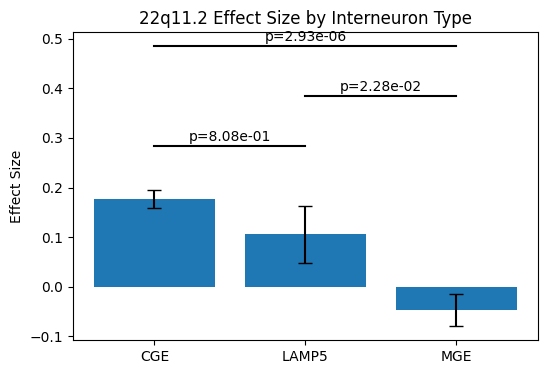

In [167]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import mannwhitneyu
import matplotlib.pyplot as plt
import numpy as np

# Compare CGE vs LAMP5
stat_cge_lamp5, p_cge_lamp5 = mannwhitneyu(X22q_Bias_CGE["EFFECT"].values,
                                          X22q_Bias_LAMP5["EFFECT"].values) 
print("CGE vs LAMP5: stat=%.3f, p=%.3e" % (stat_cge_lamp5, p_cge_lamp5))

# Compare LAMP5 vs MGE 
stat_lamp5_mge, p_lamp5_mge = mannwhitneyu(X22q_Bias_LAMP5["EFFECT"].values,
                                          X22q_Bias_MGE["EFFECT"].values)
print("LAMP5 vs MGE: stat=%.3f, p=%.3e" % (stat_lamp5_mge, p_lamp5_mge))

# Compare CGE vs MGE
stat_cge_mge, p_cge_mge = mannwhitneyu(X22q_Bias_CGE["EFFECT"].values, 
                                      X22q_Bias_MGE["EFFECT"].values)
print("CGE vs MGE: stat=%.3f, p=%.3e" % (stat_cge_mge, p_cge_mge))

# Create bar plot
means = [X22q_Bias_CGE["EFFECT"].mean(),
         X22q_Bias_LAMP5["EFFECT"].mean(), 
         X22q_Bias_MGE["EFFECT"].mean()]
sems = [X22q_Bias_CGE["EFFECT"].std()/np.sqrt(len(X22q_Bias_CGE)),
        X22q_Bias_LAMP5["EFFECT"].std()/np.sqrt(len(X22q_Bias_LAMP5)),
        X22q_Bias_MGE["EFFECT"].std()/np.sqrt(len(X22q_Bias_MGE))]

plt.figure(figsize=(6,4))
bars = plt.bar(['CGE', 'LAMP5', 'MGE'], means, yerr=sems, capsize=5)
plt.ylabel('Effect Size')
plt.title('22q11.2 Effect Size by Interneuron Type')

# Add significance markers
y_max = max(means) + max(sems) + 0.05
plt.plot([0,1], [y_max, y_max], 'k-')
plt.text(0.5, y_max+0.01, f'p={p_cge_lamp5:.2e}', ha='center')

y_max2 = y_max + 0.1
plt.plot([1,2], [y_max2, y_max2], 'k-')
plt.text(1.5, y_max2+0.01, f'p={p_lamp5_mge:.2e}', ha='center')

y_max3 = y_max + 0.2
plt.plot([0,2], [y_max3, y_max3], 'k-')
plt.text(1, y_max3+0.01, f'p={p_cge_mge:.2e}', ha='center')

plt.show()

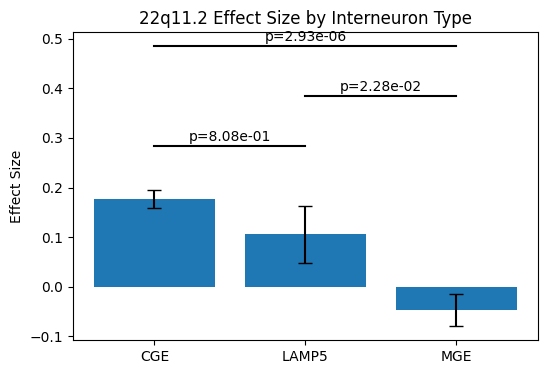

In [168]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import mannwhitneyu
import matplotlib.pyplot as plt
import numpy as np

# Create bar plot


plt.figure(figsize=(6,4))
bars = plt.bar(['CGE', 'LAMP5', 'MGE'], means, yerr=sems, capsize=5)
plt.ylabel('Effect Size')
plt.title('22q11.2 Effect Size by Interneuron Type')

# Add significance markers
y_max = max(means) + max(sems) + 0.05
plt.plot([0,1], [y_max, y_max], 'k-')
plt.text(0.5, y_max+0.01, f'p={p_cge_lamp5:.2e}', ha='center')

y_max2 = y_max + 0.1
plt.plot([1,2], [y_max2, y_max2], 'k-')
plt.text(1.5, y_max2+0.01, f'p={p_lamp5_mge:.2e}', ha='center')

y_max3 = y_max + 0.2
plt.plot([0,2], [y_max3, y_max3], 'k-')
plt.text(1, y_max3+0.01, f'p={p_cge_mge:.2e}', ha='center')

plt.show()

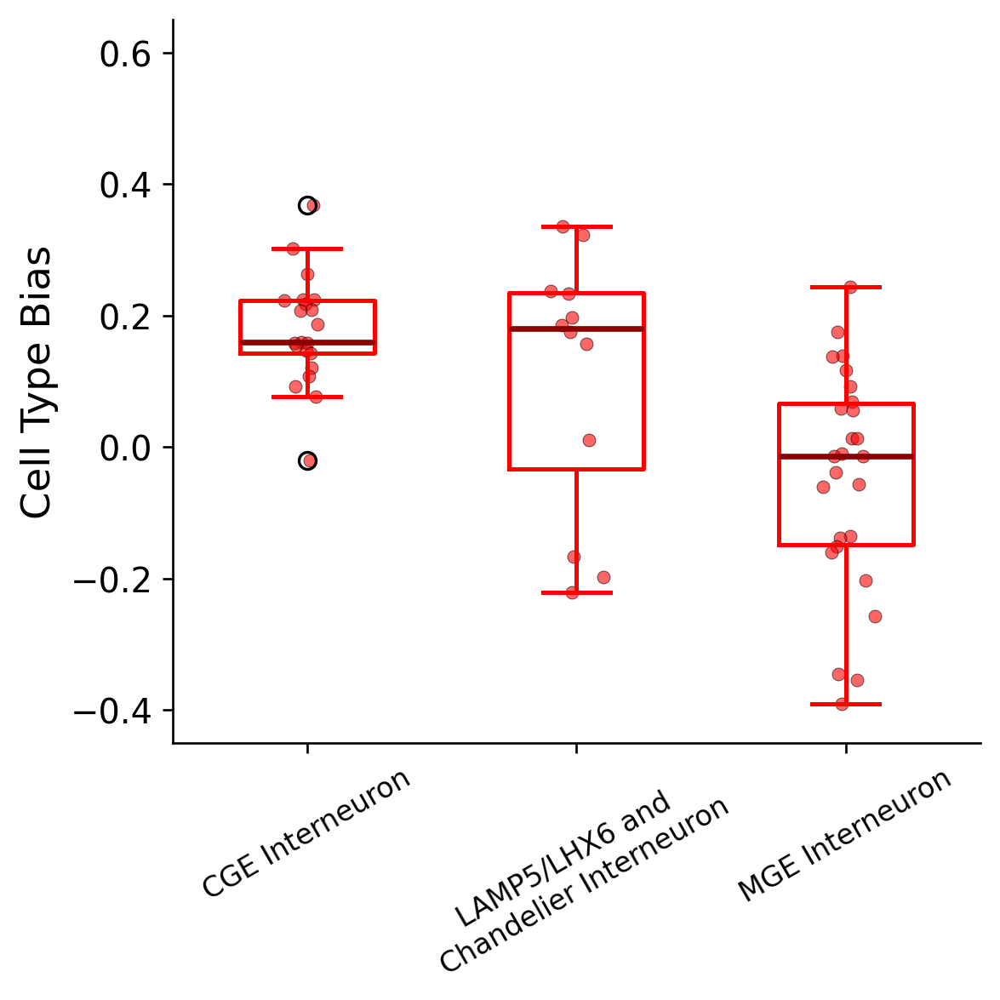

In [169]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import mannwhitneyu

# Prepare data
datasets = ['CGE Interneuron', 'LAMP5/LHX6 and \nChandelier Interneuron', 'MGE Interneuron']
labels = datasets

# Get data
dat = [X22q_Bias_CGE["EFFECT"], X22q_Bias_LAMP5["EFFECT"], X22q_Bias_MGE["EFFECT"]]

# Perform Mann-Whitney U tests between groups
stat_cge_lamp5, p_cge_lamp5 = mannwhitneyu(dat[0], dat[1])
stat_lamp5_mge, p_lamp5_mge = mannwhitneyu(dat[1], dat[2]) 
stat_cge_mge, p_cge_mge = mannwhitneyu(dat[0], dat[2])

# Create figure
plt.figure(figsize=(5,5), dpi=240)

# Plot boxplots
pos_boxes = plt.boxplot(dat, positions=np.arange(len(datasets)), widths=0.5,
                       patch_artist=False,
                       boxprops=dict(color="red", linewidth=1.5),
                       medianprops=dict(color="darkred", linewidth=2),
                       whiskerprops=dict(color="red", linewidth=1.5),
                       capprops=dict(color="red", linewidth=1.5))

# Add data points
for i in range(len(datasets)):
    # Add jittered points
    x_pos = np.random.normal(i, 0.04, size=len(dat[i]))
    plt.scatter(x_pos, dat[i], color='red', alpha=0.6, s=20, edgecolor='k', linewidth=0.3)

# Customize plot
plt.xticks(range(len(labels)), labels, fontsize=10, fontweight='normal', rotation=30)
plt.yticks(fontsize=12, fontweight='normal')
plt.ylabel("Cell Type Bias", fontsize=14, fontweight='normal')
plt.ylim(-0.45, 0.65)

# Remove unnecessary spines for a cleaner look
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

plt.tight_layout()
plt.show()


### VIP+ vs VIP- 

In [181]:
GABA_ALL = Anno[(Anno["Supercluster"]=="CGE interneuron")]
GABA_ALL_idx = GABA_ALL.index.values

index = []
PV = []
SST = []
VIP = []
CCK = []
GABA = []
CR = []
BiasA = []
BiasB = []

for idx in GABA_ALL_idx:
    PV.append(ExpL.loc[GeneSymbol2Entrez["PVALB"], idx])
    SST.append(ExpL.loc[GeneSymbol2Entrez["SST"], idx])
    VIP.append(ExpL.loc[GeneSymbol2Entrez["VIP"], idx])
    CCK.append(ExpL.loc[GeneSymbol2Entrez["CCK"], idx])
    GABA.append(ExpL.loc[GeneSymbol2Entrez["SLC32A1"], idx])
    CR.append(ExpL.loc[GeneSymbol2Entrez["CALB2"], idx])

    BiasA.append(X22q_Bias.loc[idx, "EFFECT"])
    BiasB.append(X22q_mousemodel.loc[idx, "EFFECT"])

tmpdf2 = pd.DataFrame({
    "Index": GABA_ALL_idx,
    "PV": PV,
    "SST": SST, 
    "VIP": VIP,
    "CCK": CCK,
    "GABA": GABA,
    "CR": CR,
    "EFFECT_22q.11": BiasA,
    "EFFECT_22q.11_mouse_gene": BiasB
})

In [228]:
cutoff = 1.0
CGE_VIP_Pos = tmpdf2[tmpdf2["VIP"] >= cutoff]["Index"].values
CGE_VIP_Neg = tmpdf2[tmpdf2["VIP"] <  cutoff]["Index"].values
# output the list of genes to file
with open("../dat/Other/CGE_VIP_Pos.txt", "w") as f:
    for gene in CGE_VIP_Pos:
        # Convert gene to string before concatenating with newline
        f.write(str(gene) + "\n")
with open("../dat/Other/CGE_VIP_Neg.txt", "w") as f:
    for gene in CGE_VIP_Neg:
        # Convert gene to string before concatenating with newline 
        f.write(str(gene) + "\n")

In [226]:
CGE_VIP_Pos

array([276, 279, 280, 281, 284, 285, 289, 290, 291, 292, 293, 294, 295,
       296])

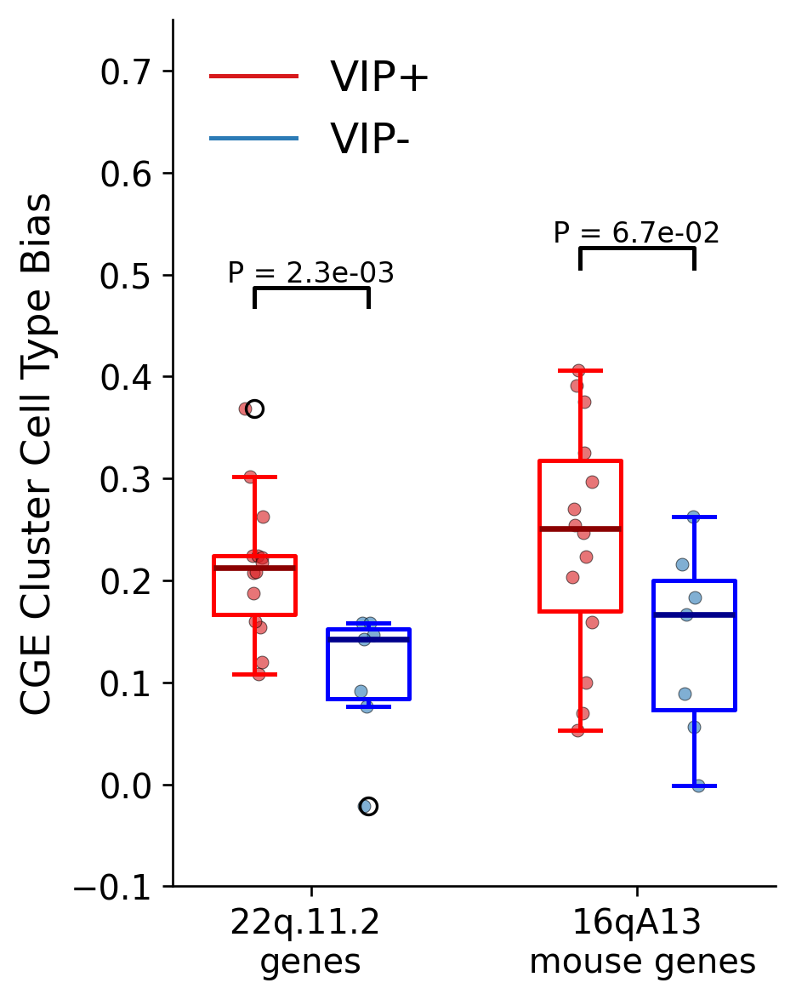

In [182]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import mannwhitneyu

cutoff = 1.0

# Sample data
VIP1 = [tmpdf2[tmpdf2["VIP"] > cutoff]["EFFECT_22q.11"],
        tmpdf2[tmpdf2["VIP"] > cutoff]["EFFECT_22q.11_mouse_gene"],
]

VIP2 = [tmpdf2[tmpdf2["VIP"] < cutoff]["EFFECT_22q.11"],
        tmpdf2[tmpdf2["VIP"] < cutoff]["EFFECT_22q.11_mouse_gene"],
]

# Labels
ticks = ['22q.11.2 \ngenes', '16qA13\n mouse genes']

# Create the figure with enhanced DPI for publication quality
plt.figure(dpi=240, figsize=(4, 5))

# Boxplot for VIP+ and VIP- groups with specific properties
summer_rain_plot = plt.boxplot(VIP1, 
                               positions=np.array(np.arange(len(VIP1)))*2.0-0.35, 
                               widths=0.5, patch_artist=False,
                               boxprops=dict(color="red", linewidth=1.5),
                               medianprops=dict(color="darkred", linewidth=2),
                               whiskerprops=dict(color="red", linewidth=1.5),
                               capprops=dict(color="red", linewidth=1.5))

winter_rain_plot = plt.boxplot(VIP2, 
                               positions=np.array(np.arange(len(VIP2)))*2.0+0.35, 
                               widths=0.5, patch_artist=False,
                               boxprops=dict(color="blue", linewidth=1.5),
                               medianprops=dict(color="darkblue", linewidth=2),
                               whiskerprops=dict(color="blue", linewidth=1.5),
                               capprops=dict(color="blue", linewidth=1.5))

# Function to define and style boxplot properties
def define_box_properties(plot_name, color_code, label):
    plt.plot([], c=color_code, label=label)
    plt.legend(frameon=False, fontsize=15, loc='upper left')

# Apply colors and labels
define_box_properties(summer_rain_plot, '#D7191C', 'VIP+')
define_box_properties(winter_rain_plot, '#2C7BB6', 'VIP-')

# Plot individual data points with jitter and transparency
for i in range(len(VIP1)):
    x1 = np.random.normal(i*2.0-0.35, 0.04, size=len(VIP1[i]))  # VIP+ jittered positions
    x2 = np.random.normal(i*2.0+0.35, 0.04, size=len(VIP2[i]))  # VIP- jittered positions
    plt.scatter(x1, VIP1[i], color='#D7191C', alpha=0.6, s=20, edgecolor='k', linewidth=0.3)
    plt.scatter(x2, VIP2[i], color='#2C7BB6', alpha=0.6, s=20, edgecolor='k', linewidth=0.3)

    # Adding p-values with appropriate placement
    stat, p = mannwhitneyu(VIP1[i], VIP2[i])
    x1, x2 = i*2.0-0.35, i*2.0+0.35  # positions of the boxes
    y, h, col = max(max(VIP1[i]), max(VIP2[i])) + 0.1, max(max(VIP1[i]), max(VIP2[i])) * 0.05, 'k'
    plt.plot([x1, x1, x2, x2], [y, y+h, y+h, y], lw=1.5, c=col)
    plt.text((x1 + x2) * .5, y + h, f"P = {p:.1e}", ha='center', va='bottom', color=col, fontsize=10, fontweight='normal')

# Set x-ticks, labels, and adjust the layout for publication quality
plt.xticks(np.arange(0, len(ticks) * 2, 2), ticks, fontsize=12, fontweight='normal')
plt.yticks(fontsize=12, fontweight='normal')
plt.ylabel("CGE Cluster Cell Type Bias", fontsize=14, fontweight='normal')
plt.ylim(-0.1, 0.75)
#plt.title("Cell Type Bias Across Different Gene Sets", fontsize=16, fontweight='bold')

# Remove unnecessary spines for a cleaner look
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

# Adjust layout to prevent clipping and improve overall appearance
plt.tight_layout()

# Show the plot
plt.show()


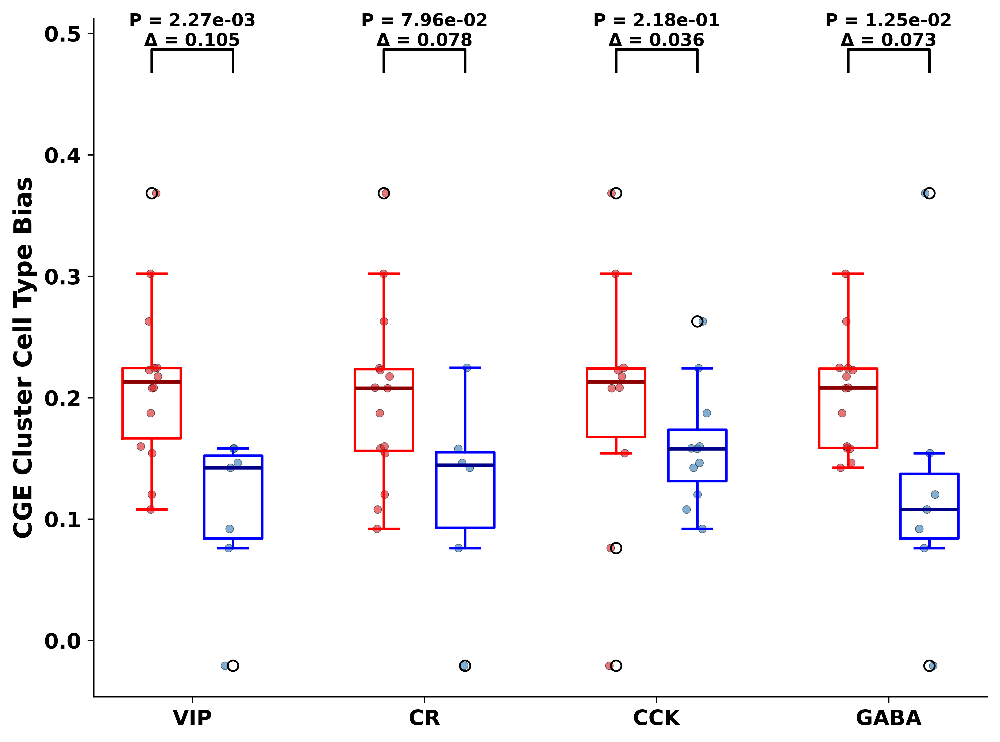

In [183]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import mannwhitneyu

cutoff = 1.0

# Sample data
VIP1 = [tmpdf2[tmpdf2["VIP"] > cutoff]["EFFECT_22q.11"],
        tmpdf2[tmpdf2["CR"] > cutoff]["EFFECT_22q.11"],
        tmpdf2[tmpdf2["CCK"] > 20]["EFFECT_22q.11"],
        tmpdf2[tmpdf2["GABA"] > 0.7]["EFFECT_22q.11"],
        ]

VIP2 = [tmpdf2[tmpdf2["VIP"] < cutoff]["EFFECT_22q.11"], 
        tmpdf2[tmpdf2["CR"] < cutoff]["EFFECT_22q.11"], 
        tmpdf2[tmpdf2["CCK"] < 20]["EFFECT_22q.11"],
        tmpdf2[tmpdf2["GABA"] < 0.7]["EFFECT_22q.11"],
        ]

# Labels
ticks = ['VIP', 'CR', 'CCK', 'GABA']

# Create the figure with enhanced DPI for publication quality
plt.figure(dpi=600, figsize=(8, 6))

# Boxplot for VIP+ and VIP- groups with specific properties
summer_rain_plot = plt.boxplot(VIP1, 
                               positions=np.array(np.arange(len(VIP1)))*2.0-0.35, 
                               widths=0.5, patch_artist=False,
                               boxprops=dict(color="red", linewidth=1.5),
                               medianprops=dict(color="darkred", linewidth=2),
                               whiskerprops=dict(color="red", linewidth=1.5),
                               capprops=dict(color="red", linewidth=1.5))

winter_rain_plot = plt.boxplot(VIP2, 
                               positions=np.array(np.arange(len(VIP2)))*2.0+0.35, 
                               widths=0.5, patch_artist=False,
                               boxprops=dict(color="blue", linewidth=1.5),
                               medianprops=dict(color="darkblue", linewidth=2),
                               whiskerprops=dict(color="blue", linewidth=1.5),
                               capprops=dict(color="blue", linewidth=1.5))

# Function to define and style boxplot properties
def define_box_properties(plot_name, color_code, label):
    plt.plot([], c=color_code, label=label)
    plt.legend(frameon=False, fontsize=15, loc='upper left')


# Plot individual data points with jitter and transparency
for i in range(len(VIP1)):
    x1 = np.random.normal(i*2.0-0.35, 0.04, size=len(VIP1[i]))  # VIP+ jittered positions
    x2 = np.random.normal(i*2.0+0.35, 0.04, size=len(VIP2[i]))  # VIP- jittered positions
    plt.scatter(x1, VIP1[i], color='#D7191C', alpha=0.6, s=20, edgecolor='k', linewidth=0.3)
    plt.scatter(x2, VIP2[i], color='#2C7BB6', alpha=0.6, s=20, edgecolor='k', linewidth=0.3)

    # Calculate mean difference between groups
    mean_diff = np.mean(VIP1[i]) - np.mean(VIP2[i])
    
    # Adding p-values and mean difference with appropriate placement
    stat, p = mannwhitneyu(VIP1[i], VIP2[i])
    x1, x2 = i*2.0-0.35, i*2.0+0.35  # positions of the boxes
    y, h, col = max(max(VIP1[i]), max(VIP2[i])) + 0.1, max(max(VIP1[i]), max(VIP2[i])) * 0.05, 'k'
    plt.plot([x1, x1, x2, x2], [y, y+h, y+h, y], lw=1.5, c=col)
    plt.text((x1 + x2) * .5, y + h, f"P = {p:.2e}\nΔ = {mean_diff:.3f}", 
             ha='center', va='bottom', color=col, fontsize=10, fontweight='bold')

# Set x-ticks, labels, and adjust the layout for publication quality
plt.xticks(np.arange(0, len(ticks) * 2, 2), ticks, fontsize=12, fontweight='bold')
plt.yticks(fontsize=12, fontweight='bold')
plt.ylabel("CGE Cluster Cell Type Bias", fontsize=14, fontweight='bold')

# Remove unnecessary spines for a cleaner look
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

# Adjust layout to prevent clipping and improve overall appearance
plt.tight_layout()

# Show the plot
plt.show()


In [198]:
HumanCT_PBS_DF = pd.read_csv("../dat/Pheno_Bias_vs_IQ/HumanCT.GeneL.csv", index_col=0)
HumanCT_PBS_DF = HumanCT_PBS_DF.sort_values("beta")

In [200]:
HumanCT_PBS_DF.head(5)

,CT,Supercluster,SpearmanR,SpearmanP,PearsonR,PearsonP,beta,CI_low,CI_high,intercept,r_value,p_value,std_err
295,295,CGE interneuron,-0.377516,0.004127,-0.383056,0.003569,-8.918079,-14.785443,-3.050715,62.398727,0.146732,0.003569,2.926542
279,279,CGE interneuron,-0.329494,0.013147,-0.371572,0.004808,-8.715744,-14.657160,-2.774327,64.911867,0.138066,0.004808,2.963478
294,294,CGE interneuron,-0.382575,0.003615,-0.398958,0.002321,-8.152247,-13.264305,-3.040189,63.225903,0.159168,0.002321,2.549808
281,281,CGE interneuron,-0.316779,0.017374,-0.315160,0.017987,-8.060151,-14.682130,-1.438172,64.123579,0.099326,0.017987,3.302932
292,292,CGE interneuron,-0.242369,0.071899,-0.323303,0.015079,-7.944026,-14.287827,-1.600224,61.858284,0.104525,0.015079,3.164181


In [201]:
HumanCT_PBS_CGE = HumanCT_PBS_DF[HumanCT_PBS_DF["Supercluster"]=="CGE interneuron"]
HumanCT_PBS_Lamp5_LHX6 = HumanCT_PBS_DF[HumanCT_PBS_DF["Supercluster"]=="LAMP5-LHX6 and Chandelier"]

In [202]:
# Add subtype column if it doesn't exist
if "subtype" not in HumanCT_PBS_Lamp5_LHX6.columns:
    HumanCT_PBS_Lamp5_LHX6["subtype"] = ""

# Set subtype for each row based on CT value
for idx, row in HumanCT_PBS_Lamp5_LHX6.iterrows():
    if row.name in [264, 265, 266]:
        HumanCT_PBS_Lamp5_LHX6.loc[idx, "subtype"] = "Chandelier"
    else:
        HumanCT_PBS_Lamp5_LHX6.loc[idx, "subtype"] = "LAMP5-LHX6"

# Add expression level columns
for i, row in HumanCT_PBS_Lamp5_LHX6.iterrows():
    HumanCT_PBS_Lamp5_LHX6.loc[i, "Pvalb_ExpL"] = ExpL.loc[GeneSymbol2Entrez["PVALB"], i]
    HumanCT_PBS_Lamp5_LHX6.loc[i, "Lamp5_ExpL"] = ExpL.loc[GeneSymbol2Entrez["LAMP5"], i] 
    HumanCT_PBS_Lamp5_LHX6.loc[i, "LHX6_ExpL"] = ExpL.loc[GeneSymbol2Entrez["LHX6"], i]

/tmp/ipykernel_1082670/3074081894.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  HumanCT_PBS_Lamp5_LHX6["subtype"] = ""
/tmp/ipykernel_1082670/3074081894.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  HumanCT_PBS_Lamp5_LHX6.loc[i, "Pvalb_ExpL"] = ExpL.loc[GeneSymbol2Entrez["PVALB"], i]
/tmp/ipykernel_1082670/3074081894.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the d

In [203]:
HumanCT_PBS_Lamp5_LHX6.sort_values("beta", ascending=True)

,CT,Supercluster,SpearmanR,SpearmanP,PearsonR,PearsonP,beta,CI_low,CI_high,intercept,r_value,p_value,std_err,subtype,Pvalb_ExpL,Lamp5_ExpL,LHX6_ExpL
267,267,LAMP5-LHX6 and Chandelier,-0.474621,0.000219,-0.354777,0.007298,-6.443808,-11.076857,-1.810759,63.368853,0.125867,0.007298,2.310887,LAMP5-LHX6,0.015717,5.756385,2.682711
269,269,LAMP5-LHX6 and Chandelier,-0.382336,0.003638,-0.300439,0.024460,-4.909546,-9.161945,-0.657148,63.373402,0.090264,0.024460,2.121025,LAMP5-LHX6,0.012757,4.660859,2.438706
268,268,LAMP5-LHX6 and Chandelier,-0.408791,0.001760,-0.303784,0.022839,-4.883216,-9.061587,-0.704845,63.385239,0.092285,0.022839,2.084101,LAMP5-LHX6,0.005725,7.565964,2.275826
271,271,LAMP5-LHX6 and Chandelier,-0.318864,0.016610,-0.265901,0.047618,-4.749541,-9.447397,-0.051684,63.034799,0.070703,0.047618,2.343212,LAMP5-LHX6,0.009889,8.282571,2.416069
270,270,LAMP5-LHX6 and Chandelier,-0.332160,0.012383,-0.274084,0.040942,-4.736617,-9.271006,-0.202228,62.562583,0.075122,0.040942,2.261677,LAMP5-LHX6,0.015155,5.763208,1.504104
265,265,LAMP5-LHX6 and Chandelier,-0.382199,0.003651,-0.275511,0.039860,-4.701549,-9.177149,-0.225949,62.397417,0.075906,0.039860,2.232354,Chandelier,1.013644,0.185133,2.733239
266,266,LAMP5-LHX6 and Chandelier,-0.454216,0.000438,-0.292665,0.028605,-4.327418,-8.184906,-0.469930,62.649056,0.085653,0.028605,1.924050,Chandelier,0.553001,0.407459,3.082165
272,272,LAMP5-LHX6 and Chandelier,-0.269440,0.044629,-0.238870,0.076230,-4.049096,-8.539953,0.441761,62.988301,0.057059,0.076230,2.239964,LAMP5-LHX6,0.005102,7.313265,2.206633
273,273,LAMP5-LHX6 and Chandelier,-0.303312,0.023062,-0.236083,0.079826,-3.890080,-8.258568,0.478408,62.978694,0.055735,0.079826,2.178928,LAMP5-LHX6,0.004917,7.645052,2.504303
264,264,LAMP5-LHX6 and Chandelier,-0.271901,0.042643,-0.222225,0.099737,-3.447660,-7.574568,0.679247,62.071666,0.049384,0.099737,2.058432,Chandelier,2.757685,0.031939,1.419853


In [204]:
for i, row in HumanCT_PBS_CGE.iterrows():
    HumanCT_PBS_CGE.loc[i, "VIP_ExpL"] = ExpL.loc[GeneSymbol2Entrez["VIP"], i]
    HumanCT_PBS_CGE.loc[i, "CCK_ExpL"] = ExpL.loc[GeneSymbol2Entrez["CCK"], i]
    HumanCT_PBS_CGE.loc[i, "CR_ExpL"] = ExpL.loc[GeneSymbol2Entrez["CALB2"], i]
    HumanCT_PBS_CGE.loc[i, "M2R_ExpL"] = ExpL.loc[GeneSymbol2Entrez["CHRM2"], i]
    HumanCT_PBS_CGE.loc[i, "NPY_ExpL"] = ExpL.loc[GeneSymbol2Entrez["NPY"], i]
    HumanCT_PBS_CGE.loc[i, "GABA_ExpL"] = ExpL.loc[GeneSymbol2Entrez["SLC32A1"], i]

    # HumanCT_PBS_CGE.loc[i, "VIP_Bias"] = CT_Z2_MAT_HC.loc[GeneSymbol2Entrez["VIP"], i]
    # HumanCT_PBS_CGE.loc[i, "CCK_Bias"] = CT_Z2_MAT_HC.loc[GeneSymbol2Entrez["CCK"], i]
    # HumanCT_PBS_CGE.loc[i, "CR_Bias"] = CT_Z2_MAT_HC.loc[GeneSymbol2Entrez["CALB2"], i]
    # HumanCT_PBS_CGE.loc[i, "M2R_Bias"] = CT_Z2_MAT_HC.loc[GeneSymbol2Entrez["CHRM2"], i]
    # HumanCT_PBS_CGE.loc[i, "NPY_Bias"] = CT_Z2_MAT_HC.loc[GeneSymbol2Entrez["NPY"], i]
    # HumanCT_PBS_CGE.loc[i, "GABA_Bias"] = CT_Z2_MAT_HC.loc[GeneSymbol2Entrez["SLC32A1"], i]

    HumanCT_PBS_CGE.loc[i, "TotalUMI"] = Anno.loc[i, "Total UMI"]

/tmp/ipykernel_1082670/3711708973.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  HumanCT_PBS_CGE.loc[i, "VIP_ExpL"] = ExpL.loc[GeneSymbol2Entrez["VIP"], i]
/tmp/ipykernel_1082670/3711708973.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  HumanCT_PBS_CGE.loc[i, "CCK_ExpL"] = ExpL.loc[GeneSymbol2Entrez["CCK"], i]
/tmp/ipykernel_1082670/3711708973.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

S

In [205]:
HumanCT_PBS_CGE.sort_values("beta", ascending=True)

,CT,Supercluster,SpearmanR,SpearmanP,PearsonR,PearsonP,beta,CI_low,CI_high,intercept,r_value,p_value,std_err,VIP_ExpL,CCK_ExpL,CR_ExpL,M2R_ExpL,NPY_ExpL,GABA_ExpL,TotalUMI
295,295,CGE interneuron,-0.377516,0.004127,-0.383056,0.003569,-8.918079,-14.785443,-3.050715,62.398727,0.146732,0.003569,2.926542,18.733238,43.597927,5.052621,0.123730,0.093864,0.757619,12338.017269
279,279,CGE interneuron,-0.329494,0.013147,-0.371572,0.004808,-8.715744,-14.657160,-2.774327,64.911867,0.138066,0.004808,2.963478,2.963595,90.443985,1.023106,1.815153,0.127217,0.822407,25857.805078
294,294,CGE interneuron,-0.382575,0.003615,-0.398958,0.002321,-8.152247,-13.264305,-3.040189,63.225903,0.159168,0.002321,2.549808,21.116175,27.631880,2.815268,0.267935,0.142493,0.914532,14501.195769
281,281,CGE interneuron,-0.316779,0.017374,-0.315160,0.017987,-8.060151,-14.682130,-1.438172,64.123579,0.099326,0.017987,3.302932,4.373322,33.676365,2.556849,0.360788,0.096688,0.689346,21801.358102
292,292,CGE interneuron,-0.242369,0.071899,-0.323303,0.015079,-7.944026,-14.287827,-1.600224,61.858284,0.104525,0.015079,3.164181,9.425919,34.196720,6.152665,1.357585,0.085859,0.836562,13349.674974
276,276,CGE interneuron,-0.483406,0.000161,-0.383471,0.003530,-7.890700,-13.075557,-2.705843,65.417236,0.147050,0.003530,2.586119,8.779327,24.634615,0.432692,1.314423,1.159135,0.914423,29291.949519
280,280,CGE interneuron,-0.201593,0.136250,-0.286159,0.032512,-6.936334,-13.273007,-0.599661,63.676933,0.081887,0.032512,3.160626,1.858206,78.125930,1.327654,0.387975,0.073051,0.666079,15170.435958
285,285,CGE interneuron,-0.293605,0.028075,-0.298656,0.025363,-6.759899,-12.653404,-0.866394,63.434401,0.089195,0.025363,2.939581,9.062500,10.305887,5.472270,0.840657,0.227176,0.874147,18438.030290
293,293,CGE interneuron,-0.329460,0.013157,-0.320248,0.016119,-6.441737,-11.640632,-1.242842,62.589198,0.102559,0.016119,2.593121,13.958615,23.516962,2.593066,0.483934,0.058396,0.715380,12579.635943
277,277,CGE interneuron,-0.333322,0.012062,-0.283576,0.034183,-6.375793,-12.258168,-0.493418,64.262281,0.080415,0.034183,2.934029,0.045455,2.483636,1.058788,7.670909,0.065455,1.015151,22521.803636


In [206]:
# 
VIP_Pos = HumanCT_PBS_CGE[HumanCT_PBS_CGE["VIP_ExpL"] > 1]
VIP_Neg = HumanCT_PBS_CGE[HumanCT_PBS_CGE["VIP_ExpL"] < 1]
CCK_Cutoff = 30
CR_Cutoff = 2
M2R_Cutoff = 2
CCKBC = VIP_Pos[(VIP_Pos["CCK_ExpL"] > CCK_Cutoff) & (VIP_Pos["CR_ExpL"] < CR_Cutoff) & (VIP_Pos["M2R_ExpL"] < M2R_Cutoff)]
ISI2 = VIP_Pos[(VIP_Pos["CCK_ExpL"] < CCK_Cutoff) & (VIP_Pos["CR_ExpL"] < CR_Cutoff) & (VIP_Pos["M2R_ExpL"] < M2R_Cutoff)]
ISI3 = VIP_Pos[(VIP_Pos["CCK_ExpL"] < CCK_Cutoff) & (VIP_Pos["CR_ExpL"] > CR_Cutoff) & (VIP_Pos["M2R_ExpL"] < M2R_Cutoff)]

# Fix: Concatenate index values using np.concatenate instead of + operator
combined_indices = np.concatenate([CCKBC.index.values, ISI2.index.values, ISI3.index.values])
Other = VIP_Pos.loc[~VIP_Pos.index.isin(combined_indices)]

print(len(CCKBC), len(ISI2), len(ISI3), len(Other))

2 2 6 4


/tmp/ipykernel_1082670/2063961874.py:4: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = plt.boxplot([CCKBC['beta'], ISI2['beta'], ISI3['beta'], Other['beta'], VIP_Neg['beta']],


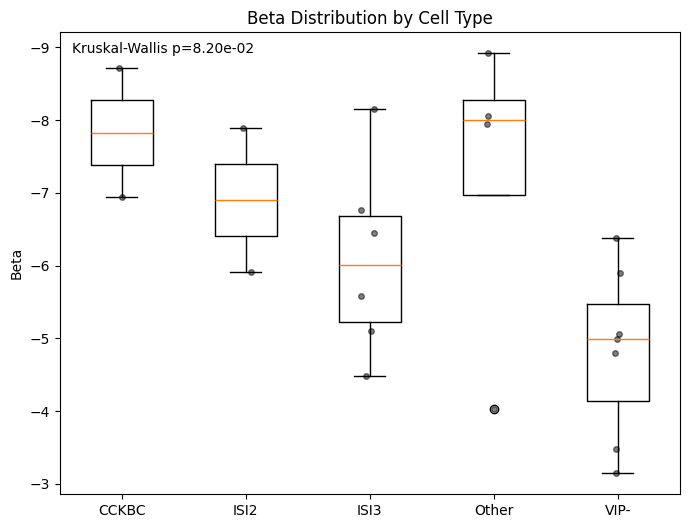

In [192]:
plt.figure(figsize=(8,6))

# Create boxplot
bp = plt.boxplot([CCKBC['beta'], ISI2['beta'], ISI3['beta'], Other['beta'], VIP_Neg['beta']],
                 labels=['CCKBC', 'ISI2', 'ISI3', 'Other', 'VIP-'])

# Add individual points with jitter
for i, data in enumerate([CCKBC['beta'], ISI2['beta'], ISI3['beta'], Other['beta'], VIP_Neg['beta']], 1):
    x = np.random.normal(i, 0.04, size=len(data))
    plt.plot(x, data, 'o', alpha=0.5, color='black', markersize=4)

plt.ylabel('Beta')
plt.title('Beta Distribution by Cell Type')

# Flip y-axis
plt.gca().invert_yaxis()

# Perform Kruskal-Wallis H-test
h_stat, p_val = stats.kruskal(CCKBC['beta'], ISI2['beta'], ISI3['beta'], Other['beta'], VIP_Neg['beta'])
plt.text(0.02, 0.98, f'Kruskal-Wallis p={p_val:.2e}', 
         transform=plt.gca().transAxes, verticalalignment='top')

plt.show()


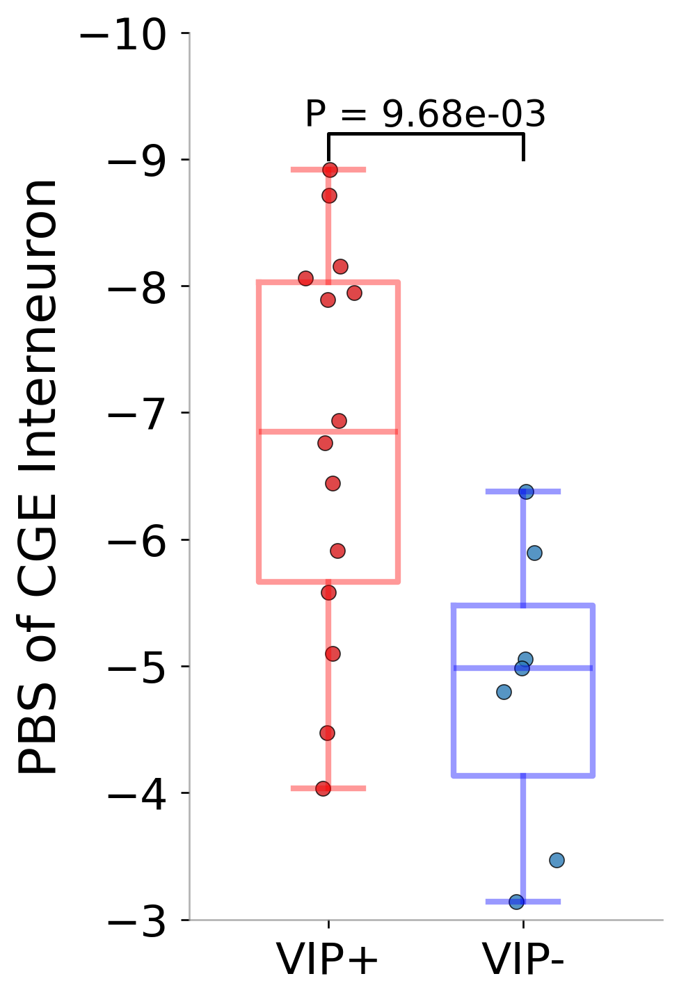

In [209]:
HumanCT_PBS_CGE_VIP_Pos = HumanCT_PBS_CGE[HumanCT_PBS_CGE["VIP_ExpL"] > 1]
HumanCT_PBS_CGE_VIP_Neg = HumanCT_PBS_CGE[HumanCT_PBS_CGE["VIP_ExpL"] < 1]
from scipy import stats

# Perform mannwhitneyu test
t_stat, p_val = stats.mannwhitneyu(HumanCT_PBS_CGE_VIP_Pos['beta'], HumanCT_PBS_CGE_VIP_Neg['beta'])

plt.figure(dpi=240, figsize=(4, 6))
plt.style.use('seaborn-v0_8-paper')

# Create boxplots for VIP+ and VIP- groups
vip_pos_plot = plt.boxplot([HumanCT_PBS_CGE_VIP_Pos['beta']], 
                          positions=[0.65],
                          widths=0.5,
                          patch_artist=False,
                          boxprops=dict(color="red", linewidth=2.5, alpha=0.4),
                          medianprops=dict(color="red", linewidth=2.5, alpha=0.4),
                          whiskerprops=dict(color="red", linewidth=2.5, alpha=0.4),
                          capprops=dict(color="red", linewidth=2.5, alpha=0.4))

vip_neg_plot = plt.boxplot([HumanCT_PBS_CGE_VIP_Neg['beta']], 
                          positions=[1.35],
                          widths=0.5,
                          patch_artist=False,
                          boxprops=dict(color="blue", linewidth=2.5, alpha=0.4),
                          medianprops=dict(color="blue", linewidth=2.5, alpha=0.4),
                          whiskerprops=dict(color="blue", linewidth=2.5, alpha=0.4),
                          capprops=dict(color="blue", linewidth=2.5, alpha=0.4))

# Add individual points with jitter
x1 = np.random.normal(0.65, 0.04, size=len(HumanCT_PBS_CGE_VIP_Pos['beta']))
x2 = np.random.normal(1.35, 0.04, size=len(HumanCT_PBS_CGE_VIP_Neg['beta']))
plt.scatter(x1, HumanCT_PBS_CGE_VIP_Pos['beta'], color='#D7191C', alpha=0.8, s=40, edgecolor='k', linewidth=0.5)
plt.scatter(x2, HumanCT_PBS_CGE_VIP_Neg['beta'], color='#2C7BB6', alpha=0.8, s=40, edgecolor='k', linewidth=0.5)

# Add p-value bracket
y = min(HumanCT_PBS_CGE_VIP_Pos['beta'].min(), HumanCT_PBS_CGE_VIP_Neg['beta'].min()) - 2
y = -9
h = 0.2
plt.plot([0.65, 0.65, 1.35, 1.35], [y, y-h, y-h, y], lw=1.5, c='k')
plt.text(1, y-h, f"P = {p_val:.2e}", ha='center', va='bottom', color='k', fontsize=16, fontweight='normal')

# Customize plot
plt.xticks([0.65, 1.35], ['VIP+', 'VIP-'], fontsize=19, fontweight='normal')
plt.yticks(fontsize=19, fontweight='normal')
plt.ylabel("PBS of CGE Interneuron", fontsize=22, fontweight='normal')

# Remove top and right spines
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
# make other spines transparent
plt.gca().spines['left'].set_visible(True)
plt.gca().spines['bottom'].set_visible(True)
plt.gca().spines['left'].set_color('grey')
plt.gca().spines['left'].set_alpha(0.6)
plt.gca().spines['bottom'].set_color('grey') 
plt.gca().spines['bottom'].set_alpha(0.6)

# Invert y-axis
plt.gca().invert_yaxis()

plt.tight_layout()
plt.ylim(-3, -10)
plt.show()


### Sup Figures


In [230]:
ExpMat = pd.read_csv("/home/jw3514/Work/BrainDisorders/data/expression/brainspan/gene_matrix/gene_exp_avg2time.csv", index_col=0)
LogExpMat = np.log2(ExpMat+1)
qnLogExpMat = quantileNormalize(LogExpMat)
Meta = pd.read_csv("/home/jw3514/Work/BrainDisorders/data/expression/brainspan/gene_matrix/rows_metadata.csv", index_col=0)
Meta = Meta[~Meta["entrez_id"].isna()]
Meta["entrez_id"] = [int(x) for x in Meta["entrez_id"].values]

Time = ['mean_2A', 'mean_2B', 'mean_3A', 'mean_3B', 'mean_4', 'mean_5',
       'mean_6', 'mean_7', 'mean_8', 'mean_9', 'mean_10', 'mean_11']

In [231]:
ASD_GW_top60 = Fil2Dict("../../UNIMED/dat/Genetics/GeneWeights/Rare/GW.ASD.top60.txt")
ASD_GW_top200 = Fil2Dict("../../UNIMED/dat/Genetics/GeneWeights/Rare/GW.ASD.top200.txt")
ASD_GW_top500 = Fil2Dict("../../UNIMED/dat/Genetics/GeneWeights/Rare/GW.ASD.top500.txt")
ASD_GW_top1000 = Fil2Dict("../../UNIMED/dat/Genetics/GeneWeights/Rare/GW.ASD.top1000.txt")

SCZ_GW_top60 = Fil2Dict("../../UNIMED/dat/Genetics/GeneWeights/Rare/GW.SCZ.top60.txt")
SCZ_GW_top200 = Fil2Dict("../../UNIMED/dat/Genetics/GeneWeights/Rare/GW.SCZ.top200.txt")
SCZ_GW_top500 = Fil2Dict("../../UNIMED/dat/Genetics/GeneWeights/Rare/GW.SCZ.top500.txt")
SCZ_GW_top1000 = Fil2Dict("../../UNIMED/dat/Genetics/GeneWeights/Rare/GW.SCZ.top1000.txt")

X22q_GW = Fil2Dict("../../UNIMED/dat/Genetics/GeneWeights/Rare/GW.22q.11.46.txt")
BP_GW_top500 = Fil2Dict("../../UNIMED/dat/Genetics/GeneWeights/Rare/GW.BP.top500.txt")

In [232]:
ASD_Genes = list(ASD_GW_top500.keys())[:60]
SCZ_Genes = list(SCZ_GW_top500.keys())[:60]
BP_Genes = list(BP_GW_top500.keys())[:60]
#DDD_Genes = 
X22q_Genes = list(X22q_GW.keys())

In [233]:
ASD_Idx = Meta[Meta["entrez_id"].isin(ASD_Genes)].index
ASD_Dat = qnLogExpMat.loc[ASD_Idx, Time]

SCZ_Idx = Meta[Meta["entrez_id"].isin(SCZ_Genes)].index
SCZ_Dat = qnLogExpMat.loc[SCZ_Idx, Time]

BP_Idx = Meta[Meta["entrez_id"].isin(BP_Genes)].index
BP_Dat = qnLogExpMat.loc[BP_Idx, Time]

#DDD_Idx = Meta[Meta["entrez_id"].isin(DDD_Genes)].index
#DDD_Dat = qnLogExpMat.loc[DDD_Idx, Time]

X22q_Idx = Meta[Meta["entrez_id"].isin(X22q_Genes)].index
X22q_Dat = qnLogExpMat.loc[X22q_Idx, Time]

ALL_Dat = qnLogExpMat.loc[:, Time]

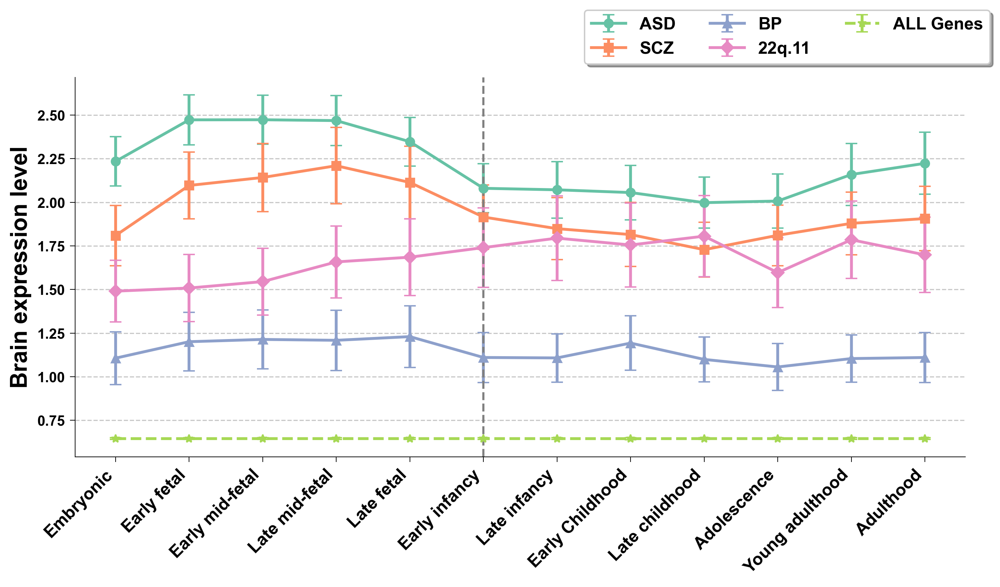

In [234]:
import matplotlib.pyplot as plt
import math
import seaborn as sns

# Create a color palette
palette = sns.color_palette("Set2", 5)

# Create the figure and axis
fig, ax = plt.subplots(dpi=300, figsize=(10, 6))

# Plotting the data with error bars
ax.errorbar(x=ASD_Dat.columns.values,
            y=ASD_Dat.mean(axis=0), 
            yerr=ASD_Dat.std(axis=0)/math.sqrt(ASD_Dat.shape[0]), 
            label="ASD", color=palette[0], marker='o', capsize=4, linewidth=2)

ax.errorbar(x=SCZ_Dat.columns.values,
            y=SCZ_Dat.mean(axis=0), 
            yerr=SCZ_Dat.std(axis=0)/math.sqrt(SCZ_Dat.shape[0]), 
            label="SCZ", color=palette[1], marker='s', capsize=4, linewidth=2)

ax.errorbar(x=BP_Dat.columns.values,
            y=BP_Dat.mean(axis=0), 
            yerr=BP_Dat.std(axis=0)/math.sqrt(BP_Dat.shape[0]), 
            label="BP", color=palette[2], marker='^', capsize=4, linewidth=2)

ax.errorbar(x=X22q_Dat.columns.values,
            y=X22q_Dat.mean(axis=0), 
            yerr=X22q_Dat.std(axis=0)/math.sqrt(X22q_Dat.shape[0]), 
            label="22q.11", color=palette[3], marker='D', capsize=4, linewidth=2)

ax.errorbar(x=ALL_Dat.columns.values,
            y=ALL_Dat.mean(axis=0), 
            yerr=ALL_Dat.std(axis=0)/math.sqrt(ALL_Dat.shape[0]), 
            label="ALL Genes", color=palette[4], ls="--", marker='*', capsize=4, linewidth=2)

# Vertical line at x = 5
ax.axvline(x=5, color='grey', ls="--", linewidth=1.5)

# Customizing x-axis ticks
labels = ["Embryonic", "Early fetal", "Early mid-fetal", "Late mid-fetal", "Late fetal", 
          "Early infancy", "Late infancy", "Early Childhood", "Late childhood", "Adolescence",
          "Young adulthood", "Adulthood"]
ax.set_xticks(ASD_Dat.columns.values)
ax.set_xticklabels(labels, rotation=45, ha='right', fontsize=12)

# Set y-axis label
ax.set_ylabel("Brain expression level", fontsize=16, weight='bold')

# Set y-axis limits
#ax.set_ylim(0.5, 4.5)

# Remove top and right spines
ax.spines[['right', 'top']].set_visible(False)

# Add grid lines
ax.grid(True, which='major', axis='y', linestyle='--', alpha=0.7)

# Move the legend outside the plot
ax.legend(loc="upper center", bbox_to_anchor=(0.8, 1.2), fancybox=True, shadow=True, ncol=3, fontsize=12)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

In [236]:
HIQ_ASD_Genes = pd.read_csv("../../ASD_Circuits/dat/Unionize_bias/ASD.HIQ.gw.csv", header=None)
HIQ_ASD_Genes = HIQ_ASD_Genes[0].values
LIQ_ASD_Genes = pd.read_csv("../../ASD_Circuits/dat/Unionize_bias/ASD.LIQ.gw.csv", header=None)
LIQ_ASD_Genes = LIQ_ASD_Genes[0].values

HIQASD_Idx = Meta[Meta["entrez_id"].isin(HIQ_ASD_Genes)].index
HIQASD_Dat = qnLogExpMat.loc[HIQASD_Idx, Time]

LIQASD_Idx = Meta[Meta["entrez_id"].isin(LIQ_ASD_Genes)].index
LIQASD_Dat = qnLogExpMat.loc[LIQASD_Idx, Time]

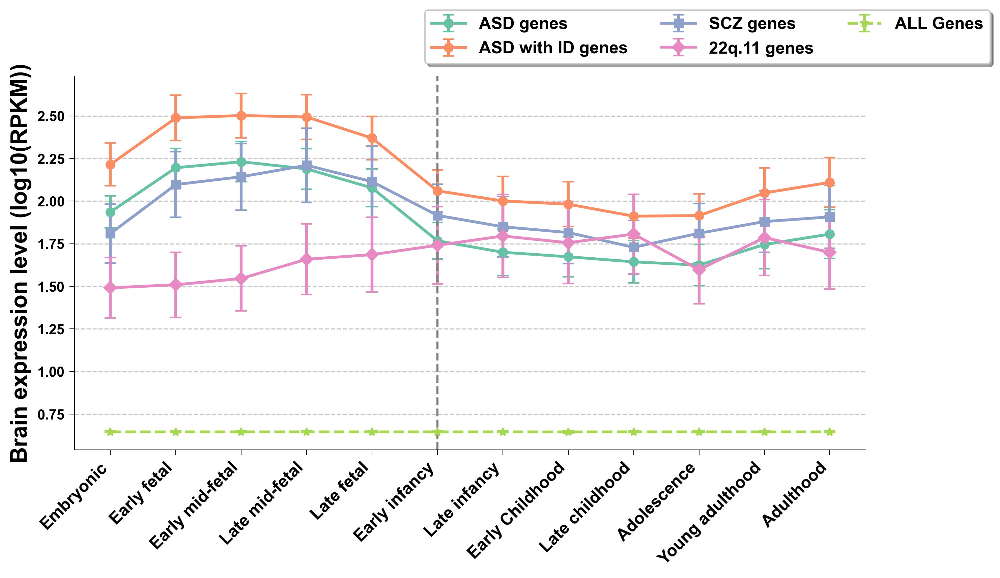

In [237]:
import matplotlib.pyplot as plt
import math
import seaborn as sns

# Create a color palette
palette = sns.color_palette("Set2", 5)

# Create the figure and axis
fig, ax = plt.subplots(dpi=300, figsize=(10, 6))

# Plotting the data with error bars
ax.errorbar(x=HIQASD_Dat.columns.values,
            y=HIQASD_Dat.mean(axis=0), 
            yerr=HIQASD_Dat.std(axis=0)/math.sqrt(ASD_Dat.shape[0]), 
            label="ASD genes", color=palette[0], marker='o', capsize=4, linewidth=2)

ax.errorbar(x=LIQASD_Dat.columns.values,
            y=LIQASD_Dat.mean(axis=0), 
            yerr=LIQASD_Dat.std(axis=0)/math.sqrt(ASD_Dat.shape[0]), 
            label="ASD with ID genes", color=palette[1], marker='o', capsize=4, linewidth=2)

ax.errorbar(x=SCZ_Dat.columns.values,
            y=SCZ_Dat.mean(axis=0), 
            yerr=SCZ_Dat.std(axis=0)/math.sqrt(SCZ_Dat.shape[0]), 
            label="SCZ genes", color=palette[2], marker='s', capsize=4, linewidth=2)

ax.errorbar(x=X22q_Dat.columns.values,
            y=X22q_Dat.mean(axis=0), 
            yerr=X22q_Dat.std(axis=0)/math.sqrt(X22q_Dat.shape[0]), 
            label="22q.11 genes", color=palette[3], marker='D', capsize=4, linewidth=2)

ax.errorbar(x=ALL_Dat.columns.values,
            y=ALL_Dat.mean(axis=0), 
            yerr=ALL_Dat.std(axis=0)/math.sqrt(ALL_Dat.shape[0]), 
            label="ALL Genes", color=palette[4], ls="--", marker='*', capsize=4, linewidth=2)

# Vertical line at x = 5
ax.axvline(x=5, color='grey', ls="--", linewidth=1.5)

# Customizing x-axis ticks
labels = ["Embryonic", "Early fetal", "Early mid-fetal", "Late mid-fetal", "Late fetal", 
          "Early infancy", "Late infancy", "Early Childhood", "Late childhood", "Adolescence",
          "Young adulthood", "Adulthood"]
ax.set_xticks(ASD_Dat.columns.values)
ax.set_xticklabels(labels, rotation=45, ha='right', fontsize=12)

# Set y-axis label
ax.set_ylabel("Brain expression level (log10(RPKM))", fontsize=16, weight='bold')

# Set y-axis limits
#ax.set_ylim(0.5, 4.5)

# Remove top and right spines
ax.spines[['right', 'top']].set_visible(False)

# Add grid lines
ax.grid(True, which='major', axis='y', linestyle='--', alpha=0.7)

# Move the legend outside the plot
ax.legend(loc="upper center", bbox_to_anchor=(0.8, 1.2), fancybox=True, shadow=True, ncol=3, fontsize=12)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

# Other (demonstrate figures)

### Heatmap of gene expression

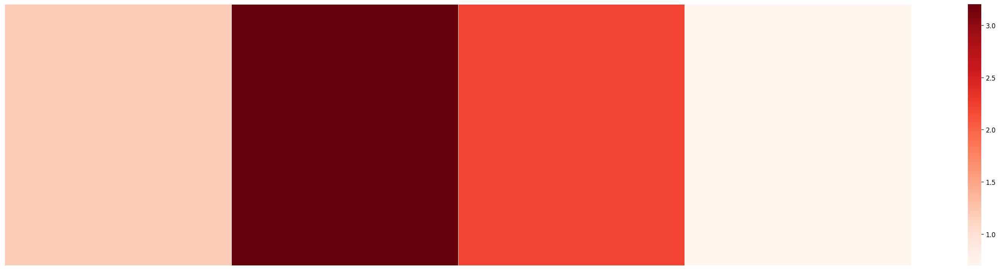

In [16]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Sample data: rows are genes, columns are cell types
data = {
    'CellType1': [1.2, 0.8, 3.1, 4.5],
    'CellType2': [3.2, 2.1, 0.6, 1.5],
    'CellType3': [2.2, 1.5, 0.9, 3.3],
    'CellType4': [0.7, 2.5, 3.3, 2.8]
}
genes = ['Gene1', 'Gene2', 'Gene3', 'Gene4']

# Create a DataFrame for gene expression
df = pd.DataFrame(data, index=genes)
df = df.head(1)

# Set up the matplotlib figure
plt.figure(figsize=(25, 6), dpi=120)

# Create a heatmap with Seaborn
sns.heatmap(df, annot=False, cmap="Reds", linewidths=0.5)

ax = sns.heatmap(df, annot=False, cmap="Reds", linewidths=0.5, cbar=False)

# Remove the axis labels
ax.set_xticklabels([])
ax.set_yticklabels([])

# Remove axis ticks as well
ax.tick_params(left=False, bottom=False)

plt.tight_layout()
plt.show()


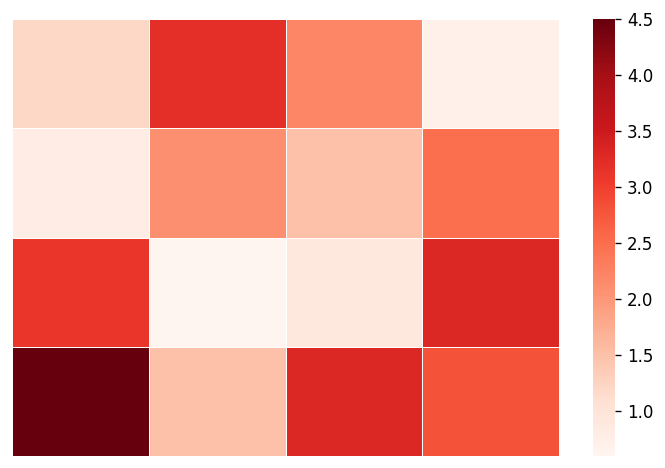

In [19]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Sample data: rows are genes, columns are cell types
data = {
    'CellType1': [1.2, 0.8, 3.1, 4.5],
    'CellType2': [3.2, 2.1, 0.6, 1.5],
    'CellType3': [2.2, 1.5, 0.9, 3.3],
    'CellType4': [0.7, 2.5, 3.3, 2.8]
}
genes = ['Gene1', 'Gene2', 'Gene3', 'Gene4']

# Create a DataFrame for gene expression
df = pd.DataFrame(data, index=genes)
#df = df.head(1)

# Set up the matplotlib figure
plt.figure(figsize=(6, 4), dpi=120)

# Create a heatmap with Seaborn
sns.heatmap(df, annot=False, cmap="Reds", linewidths=0.5)

ax = sns.heatmap(df, annot=False, cmap="Reds", linewidths=0.5, cbar=False)

# Remove the axis labels
ax.set_xticklabels([])
ax.set_yticklabels([])

# Remove axis ticks as well
ax.tick_params(left=False, bottom=False)

plt.tight_layout()
plt.show()


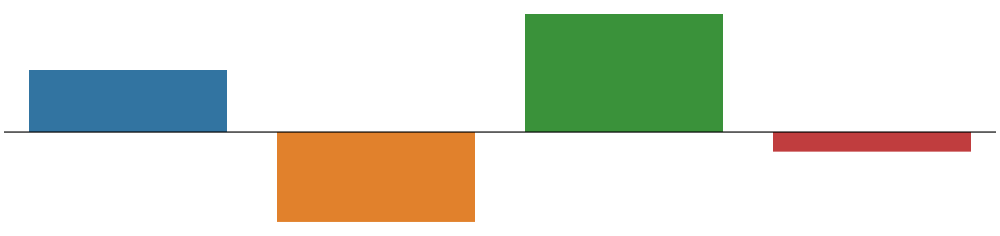

In [274]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Sample data: rows are genes, columns are cell types
data = {
    'CellType1': [2.2, -0.8, 3.1, -2.5],
    'CellType2': [-3.2, 2.1, 0.6, 1.5],
    'CellType3': [4.2, 1.5, 0.9, 3.3],
    'CellType4': [-0.7, 2.5, 3.3, 2.8]
}
genes = ['Gene1', 'Gene2', 'Gene3', 'Gene4']

# Create a DataFrame for gene expression
df = pd.DataFrame(data, index=genes)
df = df.head(1)

# Set up the matplotlib figure
plt.figure(figsize=(25, 6), dpi=120)

# Create a barplot
ax = sns.barplot(data=df)

# Remove the axis labels
ax.set_xticklabels([])
ax.set_yticklabels([])

# Remove axis ticks as well
ax.tick_params(left=False, bottom=False)

# Remove all spines (frame) of the plot
for spine in ax.spines.values():
    spine.set_visible(False)

# Add a horizontal line at y=0
ax.axhline(y=0, color='black', linewidth=2)

# Improve layout and display the plot
plt.tight_layout()
plt.show()


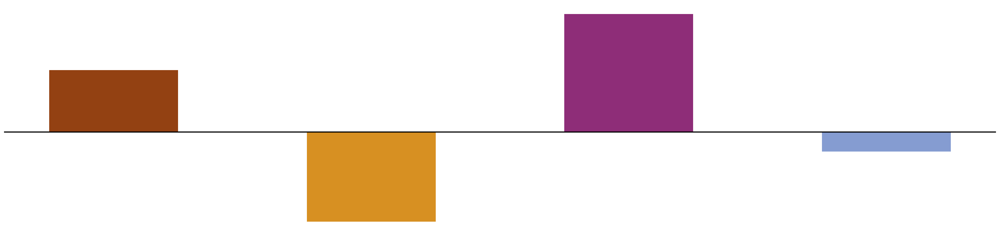

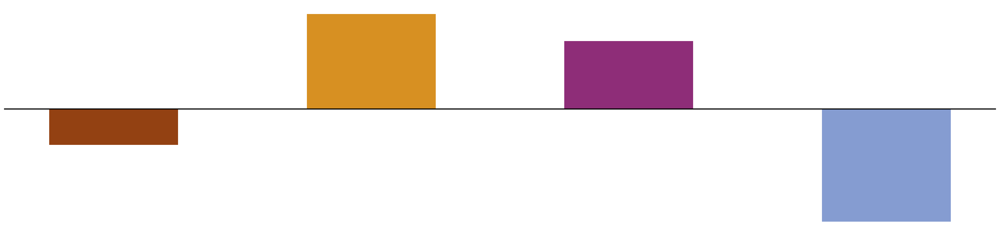

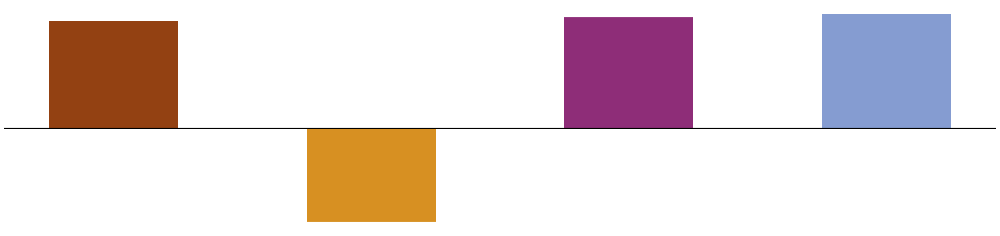

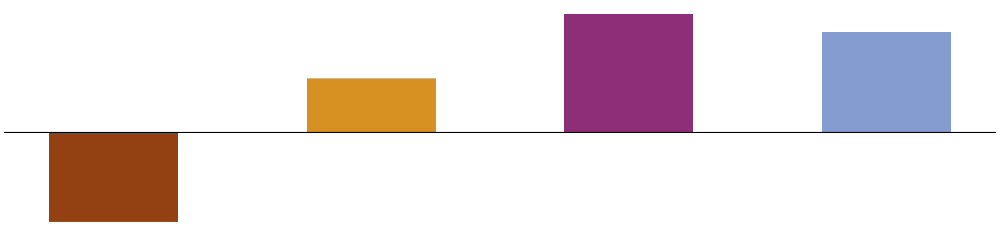

In [293]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Sample data: rows are genes, columns are cell types
data = {
    'CellType1': [2.2, -0.8, 3.1, -2.5],
    'CellType2': [-3.2, 2.1, -2.7, 1.5],
    'CellType3': [4.2, 1.5, 3.2, 3.3],
    'CellType4': [-0.7, -2.5, 3.3, 2.8]
}
genes = ['Gene1', 'Gene2', 'Gene3', 'Gene4']

# Create a DataFrame for gene expression
df = pd.DataFrame(data, index=genes)


# Set up the matplotlib figure

for i, row in df.iterrows():
    df_plot = row
    plt.figure(figsize=(25, 6), dpi=120)

    # Create a barplot with different colors for each bar and thinner width
    colors = ['#934112', '#d79022', '#8e2d78', '#859cd1']  # Define colors
    ax = plt.bar(range(len(df_plot)), df_plot.values, color=colors, width=0.5)

    # Remove the axis labels
    plt.xticks([])
    plt.yticks([])

    # Remove axis ticks as well
    plt.tick_params(left=False, bottom=False)

    # Remove all spines (frame) of the plot
    for spine in plt.gca().spines.values():
        spine.set_visible(False)

    # Add a horizontal line at y=0
    plt.axhline(y=0, color='black', linewidth=2)

    # Improve layout and display the plot
    plt.tight_layout()
    plt.show()


In [281]:
df

,CellType1,CellType2,CellType3,CellType4
Gene1,2.2,-3.2,4.2,-0.7
Gene2,-0.8,2.1,1.5,2.5
Gene3,3.1,2.7,3.2,3.3
Gene4,-2.5,1.5,3.3,2.8


### QQ PLot show genes we using

In [256]:
SCZMutDF = pd.read_csv("../dat3/SCZ.ALLGENE.MutCountModified.csv")
SCZMutDF["Rank"] = SCZMutDF.index.values
SCZMutDF["Entrez"] = [int(x) for x in SCZMutDF["Entrez"].values]
SCZMutDF = SCZMutDF.set_index("Entrez")

In [257]:
SCZMutDF.head(2)

,Gene Symbol,Gene Name,Case PTV,Ctrl PTV,Case mis3,Ctrl mis3,Case mis2,Ctrl mis2,P ca/co (Class 1),P ca/co (Class 2),...,nLGD,nMis3,nMis2,LGD_OR,Mis3_OR,Mis2_OR,LGD_pen,Mis3_pen,Mis2_pen,Rank
Entrez,,,,,,,,,,,,,,,,,,,,,
9739,SETD1A,SET domain containing 1A,15.0,3.0,3.0,4.0,11,10,3.600000e-07,0.000588,...,17.252543,2.003391,8.508477,19.064378,3.211252,4.380156,0.067661,0.014307,0.019408,0
8454,CUL1,Cullin 1,8.0,1.0,2.0,0.0,7,16,1.010000e-05,0.261000,...,10.750848,2.000000,3.013563,21.067577,12.042194,1.889051,0.075481,0.051619,0.008466,1


In [258]:
SCZMutDF.columns.values


array(['Gene Symbol', 'Gene Name', 'Case PTV', 'Ctrl PTV', 'Case mis3',
       'Ctrl mis3', 'Case mis2', 'Ctrl mis2', 'P ca/co (Class 1)',
       'P ca/co (Class 2)', 'P ca/co (comb)', 'De novo PTV',
       'De novo mis3', 'De novo mis2', 'P de novo', 'P meta', 'Q meta',
       'OR (PTV)', 'OR (Class I)', 'OR (Class II)', 'Case syn',
       'Ctrl syn', 'P ca/co (syn)', 'P meta, no gnomAD',
       'Case/Ctrl PTV, no gnomAD', 'Case/Ctrl mis3, no gnomAD',
       'Case/Ctrl mis2, no gnomAD', 'P ca/co (Class I), no gnomAD',
       'P ca/co (Class II), no gnomAD', 'P ca/co (comb), no gnomAD',
       'pLI', 'nLGD', 'nMis3', 'nMis2', 'LGD_OR', 'Mis3_OR', 'Mis2_OR',
       'LGD_pen', 'Mis3_pen', 'Mis2_pen', 'Rank'], dtype=object)

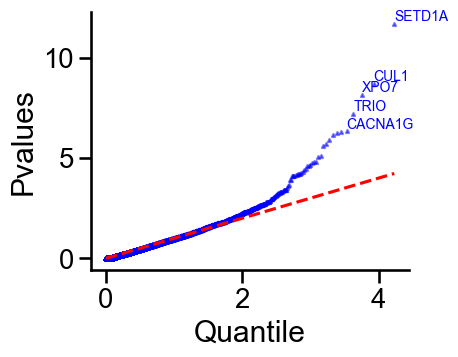

In [278]:
# Create QQ plot for P meta values
import scipy.stats as stats
import numpy as np

# Get P meta values and sort them with corresponding gene symbols
p_values = SCZMutDF['P meta'].values
gene_symbols = SCZMutDF['Gene Symbol'].values

# Remove any NaN values
mask = ~np.isnan(p_values)
p_values = p_values[mask]
gene_symbols = gene_symbols[mask]

# Convert to -log10 scale
p_values = -np.log10(p_values)

# Create array of tuples with p-values and gene symbols
p_value_genes = list(zip(p_values, gene_symbols))

# Sort by p-value while keeping gene symbols aligned
p_value_genes.sort(key=lambda x: x[0])
p_values = np.array([x[0] for x in p_value_genes])
gene_symbols = np.array([x[1] for x in p_value_genes])

# Generate expected values under null hypothesis
n = len(p_values)
expected = -np.log10(np.arange(1, n+1)/(n+1))
expected = np.sort(expected)

# Create QQ plot
plt.figure(figsize=(5,4))

# Remove top and right spines
ax = plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Check for infinite values before plotting
mask = np.isfinite(expected) & np.isfinite(p_values)
plt.scatter(expected[mask], p_values[mask], alpha=0.5, marker="^", color="blue", s=5)
plt.plot([0, max(expected[mask])], [0, max(expected[mask])], 'r--') # Add diagonal line

# Label top 5 genes
for i in range(min(5, len(p_values))):
    if np.isfinite(expected[-(i+1)]) and np.isfinite(p_values[-(i+1)]):
        plt.text(expected[-(i+1)], p_values[-(i+1)], 
                gene_symbols[-(i+1)],
                fontsize=10, ha='left', va='bottom', color="blue")

plt.xlabel('Quantile')
plt.ylabel('Pvalues')

plt.tight_layout()
plt.show()

In [279]:
Spark_Meta_1stage = pd.read_excel("~/Work/SPARK2020/TabS_DenovoWEST_Stage1.xlsx",
                           skiprows=1, sheet_name="AllGenes")

In [284]:
# Drop rows where pDenovoWEST cannot be converted to float
Spark_Meta_1stage = Spark_Meta_1stage[pd.to_numeric(Spark_Meta_1stage['pDenovoWEST'], errors='coerce').notna()]

In [285]:
Spark_Meta_1stage.head(2)

,GeneID,EntrezID,HGNC,CytoBand,ExACpLI,LoFOvsE,LOEUF,LOEUFbin,SynOvsE,sHet,...,AllExpected,pAllEnrich,MisObserved,MisExpected,pMisEnrich,MisEvents,MisDist,pMisCluster,pMisComb,pDenovoWEST
0,ENSG00000143442,23126,POGZ,1q21.3,1,0.045859,0.119,0,0.97057,0.214955,...,0.306547,0.0,0.396,0.162758,0.1,4,170.7,0.00692,0.00583,0.0
1,ENSG00000169057,4204,MECP2,Xq28,0.69809,0.085755,0.407,1,2.0282,0.088203,...,0.065821,0.0,4.329,0.04961,0.0,13,170.9,0.00197,0.0,0.0


In [286]:
Spark_Meta_1stage.columns.values

array(['GeneID', 'EntrezID', 'HGNC', 'CytoBand', 'ExACpLI', 'LoFOvsE',
       'LOEUF', 'LOEUFbin', 'SynOvsE', 'sHet', 'Arisk', 'forecASD',
       'SFARICategory', 'SFARIScore', 'DDDCategory', 'DDDAllelic',
       'DDDMutCons', 'DDDOrgan', 'AutismMerged_LoF',
       'AutismMerged_LoF_Rate', 'ASC_LoF', 'MSSNG_LoF', 'SSC_LoF',
       'SPARK_LoF', 'Control_LoF', 'AutismMerged_Dmis_REVEL0.5',
       'AutismMerged_Dmis_REVEL0.5_Rate', 'ASC_Dmis_REVEL0.5',
       'MSSNG_Dmis_REVEL0.5', 'SSC_Dmis_REVEL0.5', 'SPARK_Dmis_REVEL0.5',
       'Control_Dmis_REVEL0.5', 'AutismMerged_Bmis_REVEL0.5',
       'AutismMerged_Bmis_REVEL0.5_Rate', 'ASC_Bmis_REVEL0.5',
       'MSSNG_Bmis_REVEL0.5', 'SSC_Bmis_REVEL0.5', 'SPARK_Bmis_REVEL0.5',
       'Control_Bmis_REVEL0.5', 'AllObserved', 'AllExpected',
       'pAllEnrich', 'MisObserved', 'MisExpected', 'pMisEnrich',
       'MisEvents', 'MisDist', 'pMisCluster', 'pMisComb', 'pDenovoWEST'],
      dtype=object)

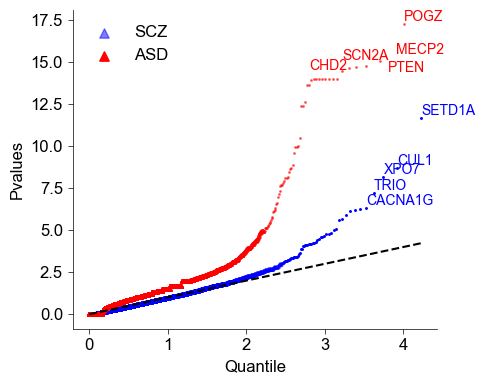

In [347]:
# Create QQ plot for P meta values
import scipy.stats as stats
import numpy as np

# Get P meta values and sort them with corresponding gene symbols
p_values_scz = SCZMutDF['P meta'].values
gene_symbols_scz = SCZMutDF['Gene Symbol'].values

# Remove any NaN values
mask_scz = ~np.isnan(p_values_scz)
p_values_scz = p_values_scz[mask_scz]
gene_symbols_scz = gene_symbols_scz[mask_scz]

# Convert to -log10 scale
p_values_scz = -np.log10(p_values_scz)

# Create array of tuples with p-values and gene symbols
p_value_genes_scz = list(zip(p_values_scz, gene_symbols_scz))

# Sort by p-value while keeping gene symbols aligned
p_value_genes_scz.sort(key=lambda x: x[0])
p_values_scz = np.array([x[0] for x in p_value_genes_scz])
gene_symbols_scz = np.array([x[1] for x in p_value_genes_scz])

# Generate expected values under null hypothesis
n_scz = len(p_values_scz)
expected_scz = -np.log10(np.arange(1, n_scz+1)/(n_scz+1))
expected_scz = np.sort(expected_scz)

# Get P meta values and sort them with corresponding gene symbols
p_values_asd = Spark_Meta_1stage['pDenovoWEST'].astype(float).values  # Convert to float
gene_symbols_asd = Spark_Meta_1stage['HGNC'].values

# Remove any NaN values
mask_asd = ~np.isnan(p_values_asd)
p_values_asd = p_values_asd[mask_asd]
gene_symbols_asd = gene_symbols_asd[mask_asd]

# Convert to -log10 scale
p_values_asd = -np.log10(p_values_asd)

# Create array of tuples with p-values and gene symbols
p_value_genes_asd = list(zip(p_values_asd, gene_symbols_asd))

# Sort by p-value while keeping gene symbols aligned
p_value_genes_asd.sort(key=lambda x: x[0])
p_values_asd = np.array([x[0] for x in p_value_genes_asd])
gene_symbols_asd = np.array([x[1] for x in p_value_genes_asd])

# Generate expected values for ASD
n_asd = len(p_values_asd)
expected_asd = -np.log10(np.arange(1, n_asd+1)/(n_asd+1))
expected_asd = np.sort(expected_asd)

# Create QQ plot
plt.figure(figsize=(5,4))

# Remove top and right spines
ax = plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Plot SCZ data with different alphas
mask_scz_plot = np.isfinite(expected_scz) & np.isfinite(p_values_scz)
plt.scatter(expected_scz[mask_scz_plot][:-60], p_values_scz[mask_scz_plot][:-60], 
           alpha=0.5, marker="^", color="blue", s=5, label='SCZ')
plt.scatter(expected_scz[mask_scz_plot][-60:], p_values_scz[mask_scz_plot][-60:], 
           alpha=1.0, marker=".", color="blue", s=5)

# Plot ASD data with different alphas
mask_asd_plot = np.isfinite(expected_asd) & np.isfinite(p_values_asd)
plt.scatter(expected_asd[mask_asd_plot][:-60], p_values_asd[mask_asd_plot][:-60], 
           alpha=1.0, marker="^", color="red", s=5, label='ASD')
plt.scatter(expected_asd[mask_asd_plot][-60:], p_values_asd[mask_asd_plot][-60:], 
           alpha=0.5, marker=".", color="red", s=5)

# Add diagonal line using max of both datasets
max_expected = max(max(expected_scz[mask_scz_plot]), max(expected_asd[mask_asd_plot]))
plt.plot([0, max_expected], [0, max_expected], 'k--')

# Label top 5 genes for SCZ
for i in range(min(5, len(p_values_scz))):
    if np.isfinite(expected_scz[-(i+1)]) and np.isfinite(p_values_scz[-(i+1)]):
        plt.text(expected_scz[-(i+1)], p_values_scz[-(i+1)], 
                gene_symbols_scz[-(i+1)],
                fontsize=10, ha='left', va='bottom', color="blue")

# Label top 5 genes for ASD with offset positions to avoid overlap
offsets = [(0, 0), (0.2, 0.2), (-0.3, 0.2), (0.4, -0.5), (-0.5, -0.3)]  # x,y offsets
for i in range(min(5, len(p_values_asd))):
    if np.isfinite(expected_asd[-(i+1)]) and np.isfinite(p_values_asd[-(i+1)]):
        x = expected_asd[-(i+1)] + offsets[i][0]
        y = p_values_asd[-(i+1)] + offsets[i][1]
        plt.text(x, y, gene_symbols_asd[-(i+1)],
                fontsize=10, ha='left', va='bottom', color="red")

plt.legend(loc='upper left', frameon=False, markerscale=3)

plt.xlabel('Quantile')
plt.ylabel('Pvalues')

plt.tight_layout()
plt.show()